In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data Preprocessing

In [2]:
#Exp REWARDS
import math
import pickle

def temperature_penalty(temperature):
    if temperature <= 38:
        return 0
    else:
        return -math.exp(abs(temperature - 38.0)/2)  # Exponential penalty

def pulse_penalty(pulse):
    if pulse <= 120:
        return 0
    else:
        return -math.exp(abs(pulse - 120) / 17)  # Exponential penalty

def respiratory_penalty(respiratory_rate):
    if respiratory_rate <= 30:
        return 0
    else:
        return -math.exp(abs(respiratory_rate - 30) / 5)  # Exponential penalty

def spo2_penalty(spo2):
    if 90 <= spo2:
        return 0
    else:
        return -math.exp(abs(spo2 - 90) / 4)  # Exponential penalty

def blood_penalty(blood_pressure):
    if blood_pressure <= 127:
        return 0
    else:
        return -math.exp(abs(blood_pressure - 127) / 5)  # Exponential penalty

def manual_normalization(x,p_min,p_max):
  return (x-p_min)/(p_max-p_min)

def min_max_normalize(column):
    #print(column.min(),column.max())
    return (column - column.min()) / (column.max() - column.min())

def reverse_min_max_normalize(column, min_val, max_val):
    return column * (max_val - min_val) + min_val

def manual_normalize_data(vital_signs,p_dict,min_max):
  for sign in vital_signs:
    p_dict[sign] = np.clip(manual_normalization(p_dict[sign],min_max[sign][0], min_max[sign][1]),0,1)
  return p_dict

def clean_data(vital_signs,p_df,min_max):
  for sign in vital_signs:
    p_df[sign] = reverse_min_max_normalize(p_df[sign], min_max[sign][0], min_max[sign][1])
  return p_df

def reward_function(sign_dict,rev_norm=False,o_values=None):
  if rev_norm:
    #print(sign_dict)
    sign_dict=clean_data(vital_signs,sign_dict,o_values)
  reward=0
  for signs in sign_dict:
    if signs=="COVERED_SKIN_TEMPERATURE":
      reward+=temperature_penalty(sign_dict[signs])
    elif signs=="PULSE_RATE":
      reward+=pulse_penalty(sign_dict[signs])
    elif signs=="RESPIRATORY_RATE":
      reward+=respiratory_penalty(sign_dict[signs])
    elif signs=="SPO2":
      reward+=spo2_penalty(sign_dict[signs])
  return reward

## Spliting Alarm & No-Alarmd Data

In [14]:
import pandas as pd

def preprocess_alarm_data(
    csv_path,
    vital_signs=['PULSE_RATE', 'RESPIRATORY_RATE', 'SPO2', 'COVERED_SKIN_TEMPERATURE'],
    time_size=5,
    reward_function=None
):
    """
    Reads a merged CSV of vital signs + alarm data and returns two pivot DataFrames:
    1. pivot_df_normal: Contains only data outside alarm periods (no alarms and not within 24h after alarm start)
    2. pivot_df_alarm: Contains only data during alarm periods (either has alarm_id or within 24h after alarm start)

    Both DataFrames undergo identical sampling and preprocessing.
    """
    # 1) Read CSV
    df = pd.read_csv(csv_path)

    # 2) Convert relevant columns to datetime
    df['generatedat'] = pd.to_datetime(df['generatedat'], errors='coerce')
    if 'alarm_vital_boundary_start_time' in df.columns:
        df['alarm_vital_boundary_start_time'] = pd.to_datetime(
            df['alarm_vital_boundary_start_time'], errors='coerce'
        )

    # 3) Remove rows without patient_id or vital sign numeric data
    df.dropna(subset=['patient_id', 'doublevalue'], inplace=True)

    # 4) Discard rows if 'name' is not in chosen vital_signs
    df = df[df['name'].isin(vital_signs)]

    # 5) Exclude out-of-range outliers
    cond = (df['name'] == 'PULSE_RATE') & (df['doublevalue'] > 300)
    df = df[~cond]
    cond = (df['name'] == 'RESPIRATORY_RATE') & (df['doublevalue'] > 60)
    df = df[~cond]
    cond = (df['name'] == 'SPO2') & ((df['doublevalue'] < 50) | (df['doublevalue'] > 100))
    df = df[~cond]
    cond = (df['name'] == 'COVERED_SKIN_TEMPERATURE') & (df['doublevalue'] > 45)
    df = df[~cond]

    # ----------------------------------------------------------------------
    # 6) Split data into alarm and non-alarm periods
    # ----------------------------------------------------------------------

    # First identify all alarm boundary times by patient
    alarm_rows = df[~df['alarm_id'].isna()].copy()
    alarm_times_by_patient = (
        alarm_rows
        .dropna(subset=['alarm_vital_boundary_start_time'])
        .groupby('patient_id')['alarm_vital_boundary_start_time']
        .unique()
        .to_dict()
    )

    def is_in_alarm_window(row):
        """Return True if row's generatedat is within 24h of any alarm start."""
        pid = row['patient_id']
        gen_time = row['generatedat']
        if pid not in alarm_times_by_patient:
            return False
        for alarm_start in alarm_times_by_patient[pid]:
            if alarm_start is pd.NaT:
                continue
            alarm_end = alarm_start + pd.Timedelta(hours=24)
            if alarm_start <= gen_time <= alarm_end:
                return True
        return False

    # Create mask for alarm period data (either has alarm_id or in alarm window)
    df['in_alarm_period'] = (~df['alarm_id'].isna()) | df.apply(is_in_alarm_window, axis=1)

    # Split the data
    df_alarm = df[df['in_alarm_period']].copy()
    df_normal = df[~df['in_alarm_period']].copy()

    # Drop the temporary column
    df_alarm.drop(columns=['in_alarm_period'], inplace=True)
    df_normal.drop(columns=['in_alarm_period'], inplace=True)

    # Function to process and pivot a DataFrame
    def process_and_pivot(df_to_process):
        df_to_process = df_to_process.copy()
        df_to_process.set_index('generatedat', inplace=True)
        df_to_process.sort_index(inplace=True)

        # Resample and pivot
        median_values = (
            df_to_process
            .groupby(['patient_id', 'name'])
            .resample(f"{time_size}T")['doublevalue']
            .median()
            .reset_index()
        )

        pivot_df = median_values.pivot_table(
            index=['patient_id', 'generatedat'],
            columns='name',
            values='doublevalue'
        ).dropna().reset_index()

        if reward_function is not None:
            pivot_df['reward'] = pivot_df.apply(
                lambda row: reward_function(row[vital_signs].to_dict()),
                axis=1
            )
        else:
            pivot_df['reward'] = 0

        return pivot_df

    # Process both DataFrames using the same function
    pivot_df_normal = process_and_pivot(df_normal)
    pivot_df_alarm = process_and_pivot(df_alarm)

    return pivot_df_normal, pivot_df_alarm

In [15]:
normal_data, alarm_data = preprocess_alarm_data(
    csv_path="/content/drive/MyDrive/Uganda/new_data/vital_alarm_sample_ver2.csv",
    time_size=20,
    reward_function=reward_function
)

print("Normal period data shape:", normal_data.shape)
print("Alarm period data shape:", alarm_data.shape)

<ipython-input-14-76c36685488a>:17: DtypeWarning: Columns (9,12,13,14,15,16,17,18,19,20,23,24,25,26,27,28,30) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)
<ipython-input-14-76c36685488a>:91: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  .resample(f"{time_size}T")['doublevalue']
<ipython-input-14-76c36685488a>:91: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  .resample(f"{time_size}T")['doublevalue']


Normal period data shape: (4119, 7)
Alarm period data shape: (1571, 7)


In [16]:
normal_data.head(5)

name,patient_id,generatedat,COVERED_SKIN_TEMPERATURE,PULSE_RATE,RESPIRATORY_RATE,SPO2,reward
0,0966e6f9-b136-448f-904f-d2d1534ad13c,2021-08-15 04:40:00,33.183352,72.636937,24.815090,98.844444,0.0
1,0966e6f9-b136-448f-904f-d2d1534ad13c,2021-08-15 05:00:00,35.506775,88.526316,16.711874,99.000000,0.0
2,0966e6f9-b136-448f-904f-d2d1534ad13c,2021-08-15 05:20:00,35.360842,89.604094,14.278960,98.429218,0.0
3,0966e6f9-b136-448f-904f-d2d1534ad13c,2021-08-15 05:40:00,34.415574,80.588235,23.316771,99.000000,0.0
4,0966e6f9-b136-448f-904f-d2d1534ad13c,2021-08-15 06:00:00,34.612439,77.620915,23.889101,99.000000,0.0


In [17]:
alarm_data.head(5)

name,patient_id,generatedat,COVERED_SKIN_TEMPERATURE,PULSE_RATE,RESPIRATORY_RATE,SPO2,reward
0,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 22:00:00,36.241132,72.744229,21.929825,97.824561,0.0
1,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 22:20:00,36.548215,83.223083,21.551724,97.000000,0.0
2,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 22:40:00,36.713810,97.405604,22.351163,96.000000,0.0
3,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 23:00:00,36.780511,97.780472,21.518965,97.000000,0.0
4,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 23:20:00,37.122598,99.016557,19.338625,96.000000,0.0


In [18]:
def calculate_nonzero_reward_percentage(df, df_name):
    total_rows = len(df)
    nonzero_rows = len(df[df['reward'] < 0])
    percentage = (nonzero_rows / total_rows) * 100 if total_rows > 0 else 0
    print(f"{df_name} data:")
    print(f"  Total rows: {total_rows}")
    print(f"  Rows with non-zero reward: {nonzero_rows}")
    print(f"  Percentage: {percentage:.2f}%")
    return percentage

# Calculate for normal data
normal_percentage = calculate_nonzero_reward_percentage(normal_data, "Normal")

# Calculate for alarm data
alarm_percentage = calculate_nonzero_reward_percentage(alarm_data, "Alarm")

summary_df = pd.DataFrame({
    'Dataset': ['Normal', 'Alarm'],
    'Total Rows': [len(normal_data), len(alarm_data)],
    'Non-zero Rows': [len(normal_data[normal_data['reward'] != 0]), len(alarm_data[alarm_data['reward'] != 0])],
    'Percentage': [normal_percentage, alarm_percentage]
})

print("\nSummary Table:")
print(summary_df)

Normal data:
  Total rows: 4119
  Rows with non-zero reward: 548
  Percentage: 13.30%
Alarm data:
  Total rows: 1571
  Rows with non-zero reward: 321
  Percentage: 20.43%

Summary Table:
  Dataset  Total Rows  Non-zero Rows  Percentage
0  Normal        4119            548   13.304200
1   Alarm        1571            321   20.432845


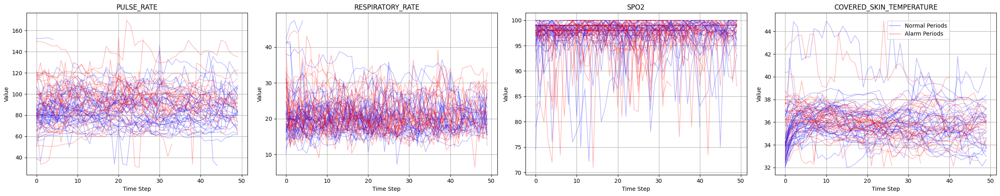

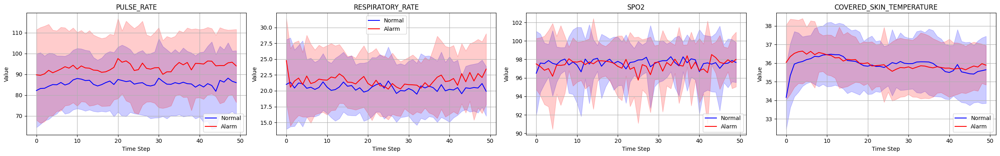

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import pandas as pd
from random import sample

def prepare_trajectories(df, vital_signs, n_samples=20, T=24):
    """
    Prepare trajectories for plotting by:
    1. Selecting random patients
    2. Extending/truncating to length T
    3. Creating 3D array (patients × time × vitals)
    """
    # Get unique patients and sample randomly
    unique_patients = df['patient_id'].unique()
    sampled_patients = sample(list(unique_patients), min(n_samples, len(unique_patients)))

    # Initialize array (patients × time × vitals)
    trajectories = np.full((len(sampled_patients), T, len(vital_signs)), np.nan)

    for i, patient in enumerate(sampled_patients):
        # Get patient data and sort by time
        patient_df = df[df['patient_id'] == patient].sort_values('generatedat')

        # Extract time series for each vital sign
        for j, vital in enumerate(vital_signs):
            if vital in patient_df.columns:
                # Get values and pad/truncate to length T
                values = patient_df[vital].values[:T]
                trajectories[i, :len(values), j] = values

    return trajectories

# Parameters
vital_signs = ['PULSE_RATE', 'RESPIRATORY_RATE', 'SPO2', 'COVERED_SKIN_TEMPERATURE']
n_samples = 50  # Number of random trajectories to plot
T = 50         # Number of time steps to show (e.g., 24 hours)

# Prepare trajectory data
normal_traj = prepare_trajectories(normal_data, vital_signs, n_samples, T)
alarm_traj = prepare_trajectories(alarm_data, vital_signs, n_samples, T)

###############################
# Spaghetti Plots
###############################
fig, axes = plt.subplots(1, 4, figsize=(25, 5))

for idx, vital in enumerate(vital_signs):
    ax = axes[idx]

    # Plot normal trajectories in blue
    for i in range(normal_traj.shape[0]):
        ax.plot(
            range(T),
            normal_traj[i, :, idx],
            alpha=0.3,
            color='blue',
            linewidth=1
        )

    # Plot alarm trajectories in red
    for i in range(alarm_traj.shape[0]):
        ax.plot(
            range(T),
            alarm_traj[i, :, idx],
            alpha=0.3,
            color='red',
            linewidth=1
        )

    ax.set_title(vital)
    ax.set_xlabel("Time Step")
    ax.set_ylabel("Value")
    ax.grid(True)

# Create legend handles
normal_line = mlines.Line2D([], [], color='blue', alpha=0.3, label='Normal Periods')
alarm_line = mlines.Line2D([], [], color='red', alpha=0.3, label='Alarm Periods')

# Add legend
fig.legend(handles=[normal_line, alarm_line], loc='upper right', bbox_to_anchor=(0.95, 0.9))

plt.tight_layout()
plt.show()

###############################
# Mean ± STD Plots
###############################
fig, axes = plt.subplots(1, 4, figsize=(25, 4))

def compute_mean_std_over_time(data):
    """Compute mean and std across patients for each time point"""
    means = np.nanmean(data, axis=0)
    stds = np.nanstd(data, axis=0)
    return means, stds

def plot_mean_std(ax, x, means, stds, label, color, alpha=0.2):
    """Plot mean with shaded std region"""
    ax.plot(x, means, color=color, label=label)
    ax.fill_between(x, means-stds, means+stds, color=color, alpha=alpha)

time_axis = np.arange(T)

for idx, vital in enumerate(vital_signs):
    ax = axes[idx]

    # Normal data
    normal_means, normal_stds = compute_mean_std_over_time(normal_traj[:, :, idx])
    plot_mean_std(ax, time_axis, normal_means, normal_stds,
                 label="Normal", color='blue', alpha=0.2)

    # Alarm data
    alarm_means, alarm_stds = compute_mean_std_over_time(alarm_traj[:, :, idx])
    plot_mean_std(ax, time_axis, alarm_means, alarm_stds,
                 label="Alarm", color='red', alpha=0.2)

    ax.set_title(vital)
    ax.set_xlabel("Time Step")
    ax.set_ylabel("Value")
    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.show()

# Previous Preprocessing

In [ ]:
import pandas as pd

def preprocess_alarm_data(
    csv_path,
    vital_signs=['PULSE_RATE', 'RESPIRATORY_RATE', 'SPO2', 'COVERED_SKIN_TEMPERATURE'],
    time_size=5,
    reward_function=None
):
    """
    Reads a merged CSV of vital signs + alarm data (e.g. 'vital_alarm_sample_ver2'),
    discards any rows with 'alarm_id' non-null, and also removes 24 hours of vitals
    following each alarm's boundary start time for that patient.

    Then continues with resampling/pivoting for the remaining rows (the "normal" vital flow).

    Returns a pivot_df with columns:
        [patient_id, generatedat] + vital_signs + ['reward']
    """

    # 1) Read CSV
    df = pd.read_csv(csv_path)

    # 2) Convert relevant columns to datetime
    df['generatedat'] = pd.to_datetime(df['generatedat'], errors='coerce')
    if 'alarm_vital_boundary_start_time' in df.columns:
        df['alarm_vital_boundary_start_time'] = pd.to_datetime(
            df['alarm_vital_boundary_start_time'], errors='coerce'
        )

    # 3) Remove rows without patient_id or vital sign numeric data
    #    (Assuming your numeric column is 'doublevalue' or similar)
    df.dropna(subset=['patient_id', 'doublevalue'], inplace=True)

    # 4) Discard rows if 'name' is not in your chosen vital_signs
    df = df[df['name'].isin(vital_signs)]

    # 5) Exclude out-of-range outliers (similar to before)
    #    Example thresholds:
    cond = (df['name'] == 'PULSE_RATE') & (df['doublevalue'] > 300)
    df = df[~cond]
    cond = (df['name'] == 'RESPIRATORY_RATE') & (df['doublevalue'] > 60)
    df = df[~cond]
    cond = (df['name'] == 'SPO2') & ((df['doublevalue'] < 50) | (df['doublevalue'] > 100))
    df = df[~cond]
    cond = (df['name'] == 'COVERED_SKIN_TEMPERATURE') & (df['doublevalue'] > 45)
    df = df[~cond]

    # ----------------------------------------------------------------------
    # 6) Filter out alarm‐related records:
    #   - If alarm_id is not NaN => discard
    #   - If alarm_id is NaN but the record is within 24h after alarm start => discard
    # ----------------------------------------------------------------------
    # A) Immediately discard rows with non-null alarm_id
    df_no_alarm = df[df['alarm_id'].isna()].copy()

    # B) Among these no‐alarm rows, check if they lie within 24h of
    #    any alarm_vital_boundary_start_time for that patient.
    #    We'll gather all alarm times by patient.
    #    Then discard if (generatedat ∈ [alarm_start, alarm_start+24h]) for any alarm_start
    alarm_rows = df[~df['alarm_id'].isna()].copy()  # those with some alarm
    # Group by patient to collect all boundary starts
    alarm_times_by_patient = (
        alarm_rows
        .dropna(subset=['alarm_vital_boundary_start_time'])  # ensure we have times
        .groupby('patient_id')['alarm_vital_boundary_start_time']
        .unique()  # gather unique start times
        .to_dict()
    )


    # For each patient in df_no_alarm, we remove rows that are within
    # 24 hours of any alarm boundary time for that patient.
    def is_in_alarm_window(row):
        """Return True if row’s generatedat is within 24h of any alarm start."""
        pid = row['patient_id']
        gen_time = row['generatedat']
        if pid not in alarm_times_by_patient:
            return False  # no alarms for that patient
        # check each alarm start time
        for alarm_start in alarm_times_by_patient[pid]:
            if alarm_start is pd.NaT:
                continue
            # define the 24h window
            alarm_end = alarm_start + pd.Timedelta(hours=24)
            if alarm_start <= gen_time <= alarm_end:
                return True
        return False

    df_no_alarm['in_alarm_window'] = df_no_alarm.apply(is_in_alarm_window, axis=1)
    # Keep only rows that are NOT in any alarm window
    df_no_alarm = df_no_alarm[~df_no_alarm['in_alarm_window']].copy()
    df_no_alarm.drop(columns=['in_alarm_window'], inplace=True, errors='ignore')

    # Now df_no_alarm has only vital signs for times with no alarms
    # and not within 24h after any alarm event for that patient.

    # 7) Set 'generatedat' as index and sort
    df_no_alarm.set_index('generatedat', inplace=True)
    df_no_alarm.sort_index(inplace=True)

    # 8) Group by (patient_id, name), then resample at time_size minutes => median
    median_values = (
        df_no_alarm
        .groupby(['patient_id', 'name'])
        .resample(f"{time_size}T")['doublevalue']
        .median()
        .reset_index()
    )

    # 9) Pivot to wide format => index=(patient_id, generatedat), columns=vital_sign
    pivot_df = median_values.pivot_table(
        index=['patient_id', 'generatedat'],
        columns='name',
        values='doublevalue'
    ).dropna().reset_index()

    # 10) If you want a reward, apply your reward_function row by row
    if reward_function is not None:
        pivot_df['reward'] = pivot_df.apply(
            lambda row: reward_function(row[vital_signs].to_dict()),
            axis=1
        )
    else:
        pivot_df['reward'] = 0

    return pivot_df

In [ ]:
pivot_df = preprocess_alarm_data(
    '/content/drive/MyDrive/Uganda/new_data/vital_alarm_sample_ver2.csv',
    vital_signs=['PULSE_RATE','RESPIRATORY_RATE','SPO2','COVERED_SKIN_TEMPERATURE'],
    time_size=5,
    reward_function=reward_function
)

pivot_df.head()

<ipython-input-53-1e8a6bca90f0>:21: DtypeWarning: Columns (9,12,13,14,15,16,17,18,19,20,23,24,25,26,27,28,30) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)
<ipython-input-53-1e8a6bca90f0>:105: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  .resample(f"{time_size}T")['doublevalue']


name,patient_id,generatedat,COVERED_SKIN_TEMPERATURE,PULSE_RATE,RESPIRATORY_RATE,SPO2,reward
0,0966e6f9-b136-448f-904f-d2d1534ad13c,2021-08-15 04:40:00,32.055629,75.000000,13.854641,98.333333,0.0
1,0966e6f9-b136-448f-904f-d2d1534ad13c,2021-08-15 04:50:00,33.250040,74.578917,23.318381,99.324786,0.0
2,0966e6f9-b136-448f-904f-d2d1534ad13c,2021-08-15 04:55:00,33.183133,76.461300,22.567287,99.281853,0.0
3,0966e6f9-b136-448f-904f-d2d1534ad13c,2021-08-15 05:00:00,32.087537,79.511111,24.271845,99.000000,0.0
4,0966e6f9-b136-448f-904f-d2d1534ad13c,2021-08-15 05:15:00,35.925628,89.699215,12.565070,99.000000,0.0


In [ ]:
pivot_df.shape

(11410, 7)

In [ ]:
import pickle

# Suppose pivot_df is your DataFrame
with open("pivot_df_raw.pkl", "wb") as f:
    pickle.dump(pivot_df, f)

## Time Series Preprocessing

In [ ]:
import numpy as np
import pandas as pd

def create_time_series_dataset(pivot_df, vital_signs, sequence_length=50):
    """
    pivot_df: after pivoting so each row corresponds to a single time step
              for a single patient, with columns = vital_signs + [patient_id, generatedat]
    vital_signs: list of columns, e.g. ['PULSE_RATE','RESPIRATORY_RATE','SPO2','COVERED_SKIN_TEMPERATURE']
    sequence_length: how many time steps to include in each training snippet

    returns:
      all_sequences: shape (num_sequences, sequence_length, len(vital_signs))
                     containing the normalized data
    """
    groups = pivot_df.groupby('patient_id')
    all_sequences = []

    for pid, group in groups:
        group = group.sort_values('generatedat')
        # we only keep the vital_signs columns as a NumPy array
        arr = group[vital_signs].values  # shape: (num_time_steps, len(vital_signs))
        # extract overlapping windows of length sequence_length
        for start_idx in range(0, len(arr) - sequence_length + 1):
            snippet = arr[start_idx : start_idx + sequence_length]
            all_sequences.append(snippet)

    all_sequences = np.array(all_sequences)  # shape => (N, T, #features)
    return all_sequences

# Example usage:
# pivot_df has shape [some_rows, vital_signs + 'patient_id' + 'generatedat']
vital_signs = ['PULSE_RATE','RESPIRATORY_RATE','SPO2','COVERED_SKIN_TEMPERATURE']
all_data = create_time_series_dataset(pivot_df, vital_signs, sequence_length=50)
# Suppose all_data.shape => (N, 50, 4)

In [ ]:
all_data

array([[[0.30023425, 0.37632456, 0.96015326, 0.09008675],
        [0.41561916, 0.20295908, 0.96551724, 0.26942675],
        [0.42344573, 0.15090774, 0.94583511, 0.25816255],
        ...,
        [0.42287137, 0.30917127, 0.96551724, 0.32896404],
        [0.40453542, 0.29614439, 0.96551724, 0.32471306],
        [0.41236198, 0.24483483, 0.86206897, 0.29131987]],

       [[0.41561916, 0.20295908, 0.96551724, 0.26942675],
        [0.42344573, 0.15090774, 0.94583511, 0.25816255],
        [0.3579747 , 0.34426857, 0.96551724, 0.18519931],
        ...,
        [0.40453542, 0.29614439, 0.96551724, 0.32471306],
        [0.41236198, 0.24483483, 0.86206897, 0.29131987],
        [0.43828126, 0.27060407, 0.89655172, 0.18046853]],

       [[0.42344573, 0.15090774, 0.94583511, 0.25816255],
        [0.3579747 , 0.34426857, 0.96551724, 0.18519931],
        [0.33642672, 0.35651336, 0.96551724, 0.20039491],
        ...,
        [0.41236198, 0.24483483, 0.86206897, 0.29131987],
        [0.43828126, 0.270604

In [ ]:
all_data.shape

(705, 50, 4)

# GMM

In [23]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.mixture import GaussianMixture
from scipy.stats import ks_2samp
import seaborn as sns
import math
import pandas as pd
import random
import pickle

In [24]:
degree_of_arm_noise=0.15
intervention_success_rate=0.7
variability_window=5

#Hyperparameters for 3 settings
setting="uganda"
min_entries=1
time_size=20
vital_signs = ['PULSE_RATE',  'RESPIRATORY_RATE', 'SPO2', 'COVERED_SKIN_TEMPERATURE']
num_comp=5
sample_size=-1
num_timesteps=1

## Helper Functions

In [25]:
#HELPER
def create_training_dataset3(pivot_df, num_timesteps, time_size, min_entries=1):
    '''
        This function inputs a dataframe, given all pateints in dataframe,
        check how many time series are valid for that patient If valid, add
        that patient to valid_patient_ids list, and return the (input, output data),
        where input is a time series of designated length, and output is the value
        at the next timestep

    '''

    input_data = []
    output_data = []
    patient_entry_counts = {}  # Dictionary to store the count of valid sequences for each patient_id
    valid_patient_ids = set()  # Set to store patient_ids that meet the min_entries threshold
    patient_rewards = {}

    # Group by 'patient_id' and process each group
    for patient_id, group in pivot_df.groupby('patient_id'):
        group = group.sort_values('generatedat')
        valid_sequences = []  # Temporary list to hold valid sequences for the current patient_id
        rewards = []

        # Iterate through the group to find valid sequences
        for i in range(len(group) - num_timesteps):
            valid_sequence = True
            base_time = group.iloc[i]['generatedat']
            for j in range(1, num_timesteps + 1):
                expected_time = base_time + pd.Timedelta(minutes=time_size * j)
                if group.iloc[i + j]['generatedat'] != expected_time:
                    valid_sequence = False
                    break
            if valid_sequence:
                input_values = group.iloc[i:i + num_timesteps][vital_signs].values.flatten()
                output_values = group.iloc[i + num_timesteps][vital_signs].values
                valid_sequences.append((input_values.astype(float), output_values.astype(float)))
                rewards.append(group.iloc[i + num_timesteps]['reward'])


        patient_rewards[patient_id] = np.mean(rewards)
        # Only add to final dataset if valid_sequences count meets the threshold
        if len(valid_sequences) > min_entries:
            valid_patient_ids.add(patient_id)
            for input_values, output_values in valid_sequences:
                input_data.append(input_values)
                output_data.append(output_values)

    return np.hstack((np.array(input_data), np.array(output_data))), list(valid_patient_ids)

def conditional_sample_mnd(given_values, given_indices, mean, cov):
    """
    Sample from the conditional distribution of a multivariate Normal Distribution

    Parameters:
    - gmm: Fitted GaussianMixture object
    - given_values: The values of the given variables
    - given_indices: The indices of the given variables

    Returns:
    - Sample from the conditional distribution
    """
    all_indices = np.arange(len(mean))
    remaining_indices = np.setdiff1d(all_indices, given_indices)

    # Convert to DataFrame
    df = pd.DataFrame(cov[0])

    # Print nicely formatted
    #print(df.to_string(index=False, float_format="%.8f"))
    #print(means,weights)
    # Calculate conditional means and covariances for each component
    mean_given = mean[given_indices]
    mean_remaining = mean[remaining_indices]
    cov_given_given = cov[np.ix_(given_indices, given_indices)]
    cov_remaining_given = cov[np.ix_(remaining_indices, given_indices)]
    cov_given_remaining = cov[np.ix_(given_indices, remaining_indices)]
    cov_remaining_remaining = cov[np.ix_(remaining_indices, remaining_indices)]
    #print("means",mean_given,mean_remaining)
    #print("covariates",cov_given_given,cov_remaining_given,cov_given_remaining,cov_remaining_remaining)

    cov_inv_given_given = np.linalg.inv(cov_given_given)
    conditional_mean = mean_remaining + cov_remaining_given @ cov_inv_given_given @ (given_values - mean_given)
    conditional_cov = cov_remaining_remaining - cov_remaining_given @ cov_inv_given_given @ cov_given_remaining

    return np.clip(np.random.multivariate_normal(mean=conditional_mean, cov=conditional_cov),0,1)


#Exp REWARDS
import math

def temperature_penalty(temperature):
    if temperature <= 38:
        return 0
    else:
        return -math.exp(abs(temperature - 38.0)/2)  # Exponential penalty

def pulse_penalty(pulse):
    if pulse <= 120:
        return 0
    else:
        return -math.exp(abs(pulse - 120) / 17)  # Exponential penalty

def respiratory_penalty(respiratory_rate):
    if respiratory_rate <= 30:
        return 0
    else:
        return -math.exp(abs(respiratory_rate - 30) / 5)  # Exponential penalty

def spo2_penalty(spo2):
    if 90 <= spo2:
        return 0
    else:
        return -math.exp(abs(spo2 - 90) / 4)  # Exponential penalty

def blood_penalty(blood_pressure):
    if blood_pressure <= 127:
        return 0
    else:
        return -math.exp(abs(blood_pressure - 127) / 5)  # Exponential penalty

def manual_normalization(x,p_min,p_max):
  return (x-p_min)/(p_max-p_min)

def min_max_normalize(column):
    #print(column.min(),column.max())
    return (column - column.min()) / (column.max() - column.min())

def reverse_min_max_normalize(column, min_val, max_val):
    return column * (max_val - min_val) + min_val

def manual_normalize_data(vital_signs,p_dict,min_max):
  for sign in vital_signs:
    p_dict[sign] = np.clip(manual_normalization(p_dict[sign],min_max[sign][0], min_max[sign][1]),0,1)
  return p_dict

def clean_data(vital_signs,p_df,min_max):
  for sign in vital_signs:
    p_df[sign] = reverse_min_max_normalize(p_df[sign], min_max[sign][0], min_max[sign][1])
  return p_df

def reward_function(sign_dict,rev_norm=False,o_values=None):
  if rev_norm:
    #print(sign_dict)
    sign_dict=clean_data(vital_signs,sign_dict,o_values)
  reward=0
  for signs in sign_dict:
    if signs=="COVERED_SKIN_TEMPERATURE":
      reward+=temperature_penalty(sign_dict[signs])
    elif signs=="PULSE_RATE":
      reward+=pulse_penalty(sign_dict[signs])
    elif signs=="RESPIRATORY_RATE":
      reward+=respiratory_penalty(sign_dict[signs])
    elif signs=="SPO2":
      reward+=spo2_penalty(sign_dict[signs])
  return reward


In [47]:
'''
    This function inputs the vital signs data of the patients and cleans the dataset
    It shrinks the vital sign data to the range of [0, 1]
    Use the create training data function, it creates the training dataset with satisfies
    valid time series criterion and return the list of patient id which is in the
    valid time series dataset.
    The training data is later used to feed a Guassuan mixture model of 5 components and
    random state 42
'''

def create_model():

    # pivot_df = preprocess_alarm_data(
    #     '/content/drive/MyDrive/Uganda/new_data/vital_alarm_sample_ver2.csv',
    #     vital_signs=['PULSE_RATE','RESPIRATORY_RATE','SPO2','COVERED_SKIN_TEMPERATURE'],
    #     time_size=5,
    #     reward_function=reward_function
    # )
    # print("pivot_df shape:", pivot_df.shape)
    # print(pivot_df.head())

    # normal data
    # pivot_df = normal_data

    # # alarm data
    pivot_df = alarm_data

    ## Normalize the vital sign value to between 0 and 1
    min_max={}
    for sign in vital_signs:
        min_max[sign] = [pivot_df[sign].min(),pivot_df[sign].max()]
        pivot_df[sign] = min_max_normalize(pivot_df[sign])

    first_val=['patient_id', 'generatedat', 'reward']
    pivot_df=pivot_df[first_val+vital_signs]

    combined_training,valid_patient_ids = create_training_dataset3(pivot_df, num_timesteps, time_size=time_size, min_entries=min_entries)
    # Save as pickle
    with open("pivot_df.pkl", "wb") as f:
        pickle.dump(pivot_df, f)
    with open("combined_training.pkl", "wb") as f:
        pickle.dump(combined_training, f)
    with open("valid_patient_ids.pkl", "wb") as f:
        pickle.dump(valid_patient_ids, f)

    gmm = GaussianMixture(n_components=5, covariance_type='full', random_state=42)
    gmm.fit(combined_training)
    return gmm,min_max

In [29]:
''' improve_vital_signs: Another model of the positive effect of intervention
    (assigning a medical device). The medical staff reacts to the alert 70%
    of time in reality, and the abnormal vital sign is adjusted probablistically
    towards the normal. This seems to be the model used in the final paper.

    Input:
        - sign_dict: A dictionary whose key is the vital sign name, and value
            is the corresponding value
        - rev_norm: a binary variable indicating whether you need to clean data
            in the beginning

    Output:
        - sign_dict: A dictionary with vital signs as key and modified value as
            values

'''

def improve_vital_signs3(sign_dict,rev_norm=False,o_values=None):
  if rev_norm:
    #print(sign_dict)
    sign_dict=clean_data(vital_signs,sign_dict,o_values)

  #print(sign_dict)
  if random.random() < intervention_success_rate:
    for signs in sign_dict:
      if signs=="COVERED_SKIN_TEMPERATURE":
        if temperature_penalty(sign_dict[signs])<0:
          sign_dict[signs]=sign_dict[signs]-np.random.normal(1.5, 0.5)
      elif signs=="PULSE_RATE":
        if pulse_penalty(sign_dict[signs])<0:
          sign_dict[signs]=sign_dict[signs]-np.random.normal(15, 5)
      elif signs=="RESPIRATORY_RATE":
        if respiratory_penalty(sign_dict[signs])<0:
          sign_dict[signs]=sign_dict[signs]-np.random.normal(10, 10/3)
      elif signs=="SPO2":
        if spo2_penalty(sign_dict[signs])<0:
          sign_dict[signs]=sign_dict[signs]+np.random.normal(3, 1)
  sign_dict=manual_normalize_data(vital_signs,sign_dict,o_values)
  return sign_dict


''' interventions: This function models the effect of intervention. if the patient's value
    falls in the normal range, then the patient's next state will be sampled from a multivariate
    Guassian from this current state

    If the patient's vital sign shows abnormality, then there is a 30% chance the doctors do not
    intervene, and there is a 70% chance the intervention creates a positive effect on the patient.
    After applying the positive effect, the patient's new state will be the condition for sampling
    the next state

    Input:
      - current_values: current values of the vital signs
      - given_indices: what indices are given in the conditional sampling

    Output:
      - value of vital signs for the next state
'''


def interventions(current_values,min_max,mean=None,cov=None,given_indices=list(range(len(vital_signs)))):
  if reward_function(dict(zip(vital_signs,current_values)),rev_norm=True,o_values=min_max)>=0:
    return conditional_sample_mnd(current_values, given_indices,mean=mean,cov=cov)
  else:
    #new_signs= conditional_sample_gmm(gmm, current_values, given_indices,component_index=component_index)
    #print("Old", current_values)
    new_signs=improve_vital_signs3(dict(zip(vital_signs,current_values)),rev_norm=True,o_values=min_max)
    #print("NEW",[new_signs[vital] for vital in vital_signs])
    return conditional_sample_mnd([new_signs[vital] for vital in vital_signs], given_indices,mean=mean,cov=cov)
    #return resample_values(gmm,min_max,component_index=component_index)[0]



''' simulate_one_step: based on the current value, calculate what's the next state for vital signs,
    the variance of vital sign for the past five timesteps, and the reward

    Input:
      - current_state: current_state[0] stores the current vital sign, current_state[2] stores the
        vital signs for the past five timesteps

    Output:
      - next_signs: the vital sign for the next timestep
      - variablity: the variance of vital signs from the past five states
      - signs_history: the vital sign history for the past five states
      - reward: the reward for the next signs
'''
def simulate_one_step(current_state,min_max,intervention=False,mean=None,cov=None,given_indices=list(range(len(vital_signs)))):
    current_signs=current_state[0]
    signs_history=current_state[2]
    # print("current-signs:", current_signs)

    if intervention:
      next_signs=interventions(current_values=current_signs,min_max=min_max,mean=mean,cov=cov)
    else:
      next_signs=conditional_sample_mnd(current_signs, given_indices,mean=mean,cov=cov)

    for i in range(len(vital_signs)):
      del signs_history[i][0]
      signs_history[i].append(next_signs[i])

    variability=[np.var(l) for l in signs_history]

    reward=reward_function(dict(zip(vital_signs,next_signs)),rev_norm=True,o_values=min_max)
    return [next_signs,variability,signs_history],reward

''' resample_values: You sample from a multivariate Gaussian for your initial value,
and you sample conditioned on the previous value until you have enough sign history to
calculate variability

Then you return the current signs, the variability of the past timesteps, the past
vital sign values, and the corresponding reward of the currrent vital sign
'''

def resample_values(min_max,given_indices,mean,cov):
  sample=np.clip(np.random.multivariate_normal(mean=mean,cov=cov),0,1)
  current_signs=[sample[i] for i in given_indices]
  signs_history=[[] for _ in range(len(vital_signs))]
  for i in range(len(vital_signs)):
    signs_history[i].append(sample[i])

  for _ in range(variability_window-1):
    current_signs=conditional_sample_mnd(current_signs, given_indices,mean=mean,cov=cov)
    for i in range(len(vital_signs)):
      signs_history[i].append(current_signs[i])

  #print(signs_history)
  #for l in signs_history:
    #print(l,np.var(l))
  variability=[np.var(l) for l in signs_history]
  #print(variability)
  reward=reward_function(dict(zip(vital_signs,current_signs)),rev_norm=True,o_values=min_max)
  return [current_signs,variability,signs_history],reward

''' sample_agent: you choose a component basesd on weight of each component for the multivariate
    Gaussian, then you get the sample from it.
    You perturb the vital sign mean and cov by choosing a mean and covariance from another component
    in the mixture model, and randomly sampling a influence factor to determine the magnitude of
    pertubation
'''
def sample_agent(gmm,min_max,given_indices):
  weights = gmm.weights_

  # Normalize the weights to ensure they sum to 1
  weights /= np.sum(weights)

  # Sample an index based on the weights
  component = np.random.choice(len(weights), p=weights)

  means = gmm.means_
  covariances = gmm.covariances_
  mean=means[component]
  cov=covariances[component]
  state, _ = resample_values(min_max,given_indices,mean=mean,cov=cov)

  perturb=random.choice([i for i in range(len(weights)) if i != component])

  x=random.uniform(0, degree_of_arm_noise)
  y=random.uniform(0, degree_of_arm_noise)

  mean=(1-x)*mean+x*means[perturb]
  cov=(1-y)*cov+y*covariances[perturb]

  #print(mean,cov)
  #pertubation
  return state,component,mean,cov

## Simulation Example + Eval



## Normal Data

In [32]:
gmm, min_max = create_model()

/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [33]:
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import random

from scipy.stats import ks_2samp  # For Kolmogorov-Smirnov two-sample test
from scipy.stats import wasserstein_distance  # For 1D Wasserstein distance


def min_max_denormalize(values, v, min_max_dict):
    """
    Given an array of normalized values for vital sign 'v',
    and a min_max_dict[v] = [min_val, max_val],
    return the denormalized array.
    """
    min_val, max_val = min_max_dict[v]
    return values * (max_val - min_val) + min_val

def compute_mean_std_over_time(data_array):
    """
    data_array shape: (num_trajectories, T)
    Returns mean and std arrays of shape (T,).
    """
    means = data_array.mean(axis=0)
    stds = data_array.std(axis=0)
    return means, stds

def plot_mean_std(ax, time, mean, std, label, color, alpha=0.2):
    """
    Plot mean line and shaded region for mean ± std on a given ax.
    """
    ax.plot(time, mean, label=label, color=color)
    ax.fill_between(time, mean - std, mean + std, color=color, alpha=alpha)

In [40]:
################################
# 1) Load Real Data
################################
with open("pivot_df.pkl", "rb") as f:
    pivot_df = pickle.load(f)

pivot_df['generatedat'] = pd.to_datetime(pivot_df['generatedat'])
grouped = pivot_df.groupby('patient_id')

MIN_LENGTH = 50  # Let's say we want at least 70 points
long_enough_ids = [pid for pid, grp in grouped if len(grp) >= MIN_LENGTH]
print(f"Number of patients with >= {MIN_LENGTH} rows: {len(long_enough_ids)}")

N = 50  # how many real trajectories to sample
random_ids = random.sample(long_enough_ids, min(N, len(long_enough_ids)))
print("Randomly selected patient IDs (REAL):", random_ids)

# Our vital signs
num_vitals = len(vital_signs)
T = 50  # we want 70 time steps from each chosen patient

# We'll store real_data in shape: (N, T, num_vitals)
real_data = np.zeros((len(random_ids), T, num_vitals))

for i, pid in enumerate(random_ids):
    subdf = grouped.get_group(pid).copy()
    subdf.sort_values('generatedat', inplace=True)
    subdf.reset_index(drop=True, inplace=True)

    # Slice first T steps
    subdf = subdf.iloc[:T]  # if fewer than T exist, it automatically truncates

    # Denormalize each vital sign
    for v_idx, v_name in enumerate(vital_signs):
        real_values_norm = subdf[v_name].values
        real_values_denorm = min_max_denormalize(real_values_norm, v_name, min_max)
        # Store in real_data
        real_data[i, :len(subdf), v_idx] = real_values_denorm

Number of patients with >= 50 rows: 49
Randomly selected patient IDs (REAL): ['7c8a532e-2506-49df-9410-3be9891146c2', 'e512b953-fa54-4572-8be4-dd1c37a5e67c', 'd7a836f6-41b1-4879-b65d-488e6f32f4ce', '6e6172cd-31e2-4c99-a6d2-90dfd7bf8781', '6ea34cf0-90ec-4dbf-ab92-fe27c10cd074', '661655ae-fb17-4171-a085-2005261cb9cc', '890f1d65-bc64-4d3b-9184-480bfccce353', '211957a3-a126-4750-9f3f-b50b57d3bcb9', 'e9a34ed3-7f9c-48d9-97b4-d31a2ca02406', 'bbad5c08-7c44-4531-8b25-6ba08a180480', '2d31b3a6-9271-47ac-8866-9aa937eecd8e', 'c79ccb46-af16-441b-ba50-c1a91eb0c3e0', '3f2cd023-2282-4589-9bc7-099b84d3dab8', '2208d7e3-ba1b-4bbb-8213-e41803d62113', '9f7f041a-916f-4eb3-82dd-77949634fb38', '22d9c73a-c781-464e-a82b-c0c7812ad652', 'c8389909-1ac2-46b3-a8b3-9f6119015a6c', '9b4f09d7-9ed5-458c-8ed9-de13825f8db4', '1c255af9-0071-4bf7-a099-50c3dc46c1d5', 'db9064d5-ff79-407a-9f59-ce7313759251', 'd81b6466-f312-4d38-a899-3d1c11dd021c', '809bf260-7de9-47b4-bdda-f343f0bc4d62', 'c45e0c0b-1386-405b-ab54-af486def820f', 'a

In [41]:
###############################
# 2) Generate Synthetic Data
###############################
# gmm, _ = create_model()  # or however you retrieve your GMM
num_synthetic = 50
T_synth = 50  # match the length used for real data
all_synthetic = np.zeros((num_synthetic, T_synth, len(vital_signs)))

given_indices = [j for j in range(len(vital_signs))]
all_indices = np.arange(gmm.means_.shape[1])
remaining_indices = np.setdiff1d(all_indices, given_indices)

for i in range(num_synthetic):
    # 1) Sample the initial state
    state, component, mean, cov = sample_agent(gmm, min_max, given_indices)

    # 2) Initialize lists to store the trajectory
    simulated_values = [state]
    simulated_reward = [0]

    # 3) Roll out T-1 additional steps
    for t in range(1, T_synth):
        given_values = simulated_values[-1]
        intervention = True
        next_values, reward = simulate_one_step(
            given_values, min_max, intervention=intervention, mean=mean, cov=cov
        )
        simulated_values.append(next_values)
        simulated_reward.append(reward)

    # 4) Convert to DataFrame for cleaning
    tmp_df = pd.DataFrame([s[0] for s in simulated_values], columns=vital_signs)
    clean_data(vital_signs, tmp_df, min_max)

    # # 5) Denormalize
    # for v_idx, v_name in enumerate(vital_signs):
    #     tmp_df[v_name] = min_max_denormalize(tmp_df[v_name].values, v_name, min_max)

    # 6) Store into all_synthetic
    all_synthetic[i, :, :] = tmp_df[vital_signs].values

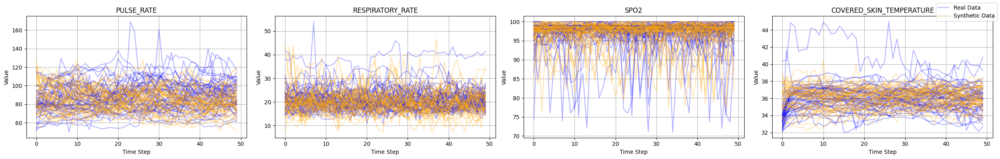

In [42]:
import matplotlib.lines as mlines

###############################
# 3) Spaghetti Plots
###############################
fig, axes = plt.subplots(1, 4, figsize=(25, 4))

for idx, vital in enumerate(vital_signs):
    ax = axes[idx]

    # Plot real data in blue
    for i in range(real_data.shape[0]):
        ax.plot(
            range(T),
            real_data[i, :, idx],
            alpha=0.3,
            color='blue'
        )
    # Plot synthetic data in orange
    for i in range(all_synthetic.shape[0]):
        ax.plot(
            range(T_synth),
            all_synthetic[i, :, idx],
            alpha=0.3,
            color='orange'
        )

    ax.set_title(vital)
    ax.set_xlabel("Time Step")
    ax.set_ylabel("Value")
    ax.grid(True)

# Create dummy artist objects just for the legend:
real_line = mlines.Line2D([], [], color='blue', alpha=0.3, label='Real Data')
synth_line = mlines.Line2D([], [], color='orange', alpha=0.3, label='Synthetic Data')

# Add a single legend for the whole figure:
fig.legend(handles=[real_line, synth_line], loc='upper right')

plt.tight_layout()
plt.show()

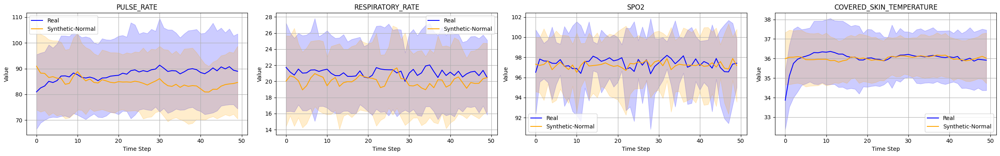

In [44]:
###############################
# 4) Mean ± Std Over Time
###############################
fig, axes = plt.subplots(1, 4, figsize=(25, 4))

time_axis = np.arange(T)  # same T for real and synthetic

for idx, vital in enumerate(vital_signs):
    ax = axes[idx]

    # Real
    real_means, real_stds = compute_mean_std_over_time(real_data[:, :, idx])
    plot_mean_std(ax, time_axis, real_means, real_stds,
                  label="Real", color='blue', alpha=0.2)

    # Synthetic
    synth_means, synth_stds = compute_mean_std_over_time(all_synthetic[:, :, idx])
    plot_mean_std(ax, time_axis, synth_means, synth_stds,
                  label="Synthetic-Normal", color='orange', alpha=0.2)

    ax.set_title(vital)
    ax.set_xlabel("Time Step")
    ax.set_ylabel("Value")
    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.show()

[PULSE_RATE] KS test on means => stat=0.205, p_value=0.217
[RESPIRATORY_RATE] KS test on means => stat=0.308, p_value=0.015
[SPO2] KS test on means => stat=0.170, p_value=0.417
[COVERED_SKIN_TEMPERATURE] KS test on means => stat=0.136, p_value=0.67


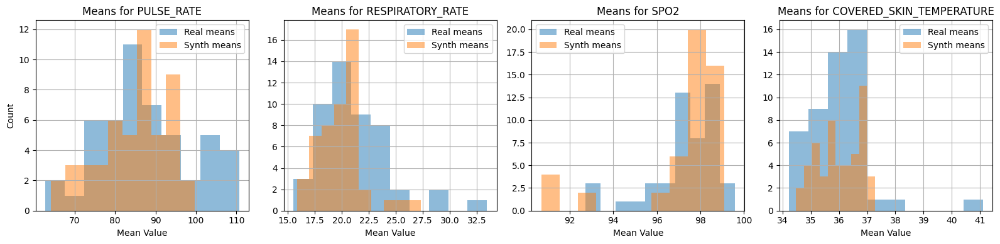

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp

def trajectory_features(trajectory):
    """
    trajectory shape: (T,) for a single vital sign
    Return mean, variance, or any other features you'd like.
    """
    return {
        "mean": np.mean(trajectory),
        "var": np.var(trajectory),
        # add more as needed
    }

# Create a figure with 4 subplots
fig, axes = plt.subplots(1, 4, figsize=(16, 4), sharey=False)

for idx, v_name in enumerate(vital_signs):
    ax = axes[idx]

    # Collect features from real data
    real_feats = []
    for i in range(real_data.shape[0]):
        feats = trajectory_features(real_data[i, :, idx])
        real_feats.append(feats)

    # Collect features from synthetic data
    synth_feats = []
    for i in range(all_synthetic.shape[0]):
        feats = trajectory_features(all_synthetic[i, :, idx])
        synth_feats.append(feats)

    # Extract the 'mean' values (or whichever feature you'd like)
    real_means = [d["mean"] for d in real_feats]
    synth_means = [d["mean"] for d in synth_feats]

    # Plot the distributions of means as overlapping histograms
    ax.hist(real_means, alpha=0.5, label="Real means")
    ax.hist(synth_means, alpha=0.5, label="Synth means")

    ax.set_title(f"Means for {v_name}")
    ax.set_xlabel("Mean Value")
    if idx == 0:
        ax.set_ylabel("Count")
    ax.grid(True)
    ax.legend()

    # Perform a KS test
    stat, p_value = ks_2samp(real_means, synth_means)
    print(f"[{v_name}] KS test on means => stat={stat:.3f}, p_value={p_value:.3g}")

plt.tight_layout()
plt.show()

## Alarm Data

In [48]:
gmm, min_max = create_model()

In [49]:
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import random

from scipy.stats import ks_2samp  # For Kolmogorov-Smirnov two-sample test
from scipy.stats import wasserstein_distance  # For 1D Wasserstein distance


def min_max_denormalize(values, v, min_max_dict):
    """
    Given an array of normalized values for vital sign 'v',
    and a min_max_dict[v] = [min_val, max_val],
    return the denormalized array.
    """
    min_val, max_val = min_max_dict[v]
    return values * (max_val - min_val) + min_val

def compute_mean_std_over_time(data_array):
    """
    data_array shape: (num_trajectories, T)
    Returns mean and std arrays of shape (T,).
    """
    means = data_array.mean(axis=0)
    stds = data_array.std(axis=0)
    return means, stds

def plot_mean_std(ax, time, mean, std, label, color, alpha=0.2):
    """
    Plot mean line and shaded region for mean ± std on a given ax.
    """
    ax.plot(time, mean, label=label, color=color)
    ax.fill_between(time, mean - std, mean + std, color=color, alpha=alpha)

In [55]:
################################
# 1) Load Real Data
################################
with open("pivot_df.pkl", "rb") as f:
    pivot_df = pickle.load(f)

pivot_df['generatedat'] = pd.to_datetime(pivot_df['generatedat'])
grouped = pivot_df.groupby('patient_id')

MIN_LENGTH = 20  # Let's say we want at least 70 points
long_enough_ids = [pid for pid, grp in grouped if len(grp) >= MIN_LENGTH]
print(f"Number of patients with >= {MIN_LENGTH} rows: {len(long_enough_ids)}")

N = 30  # how many real trajectories to sample
random_ids = random.sample(long_enough_ids, min(N, len(long_enough_ids)))
print("Randomly selected patient IDs (REAL):", random_ids)

# Our vital signs
num_vitals = len(vital_signs)
T = 20  # we want 70 time steps from each chosen patient

# We'll store real_data in shape: (N, T, num_vitals)
real_data = np.zeros((len(random_ids), T, num_vitals))

for i, pid in enumerate(random_ids):
    subdf = grouped.get_group(pid).copy()
    subdf.sort_values('generatedat', inplace=True)
    subdf.reset_index(drop=True, inplace=True)

    # Slice first T steps
    subdf = subdf.iloc[:T]  # if fewer than T exist, it automatically truncates

    # Denormalize each vital sign
    for v_idx, v_name in enumerate(vital_signs):
        real_values_norm = subdf[v_name].values
        real_values_denorm = min_max_denormalize(real_values_norm, v_name, min_max)
        # Store in real_data
        real_data[i, :len(subdf), v_idx] = real_values_denorm

Number of patients with >= 20 rows: 32
Randomly selected patient IDs (REAL): ['1de24af6-c2c9-4f8e-872a-256ca8c22a3a', '0b6e7bb1-327e-4cc7-a804-f279a708a386', '57e58663-8684-4234-9f54-716723adb18e', '5363e8d6-c4d9-4d78-a0a8-aa8f0fee6037', '5d7450f7-7dad-4ce5-9e8b-263de7c055eb', '0aace22c-e015-4f97-aa5c-5d06475b9dd4', 'a074d464-cb54-41cd-ac75-889aea323d3c', 'c24cd252-0404-445a-8828-6e86d39fd00a', '85ccbccf-c122-4490-8d93-384fe895144c', 'afb17d4a-c149-4868-a2e3-b3b204dbea42', '0f8c4643-babd-44b4-9425-10c5c8827616', 'c78d002c-ab08-465d-a120-4ea1959e1d6f', 'f1ceccde-5e6b-4b6b-99b3-2b265409b938', '63b35e01-8f43-49a6-8fe7-2d4c6ca077ee', 'b0e7d518-926a-4ffe-894f-1b73b6388a70', '8dd5092e-6826-4285-89df-27964a185fca', '96958298-7701-43eb-8aa9-0a10b4e7561f', '30080adc-58b6-4cca-a603-b790aa4326fa', 'e85f626a-cc76-42d1-8310-c7874a6b655b', '3d565efe-8a4b-4409-a0e5-ad50723a55df', '49f9c887-9337-42f6-9914-0bede71318e9', 'eed1e910-25b1-4b84-bf59-4a06b41ec479', '57b32cc0-ec0b-42d1-80d7-c95b5a0e20ae', 'c

In [56]:
###############################
# 2) Generate Synthetic Data
###############################
# gmm, _ = create_model()  # or however you retrieve your GMM
num_synthetic = 30
T_synth = 20  # match the length used for real data
all_synthetic = np.zeros((num_synthetic, T_synth, len(vital_signs)))

given_indices = [j for j in range(len(vital_signs))]
all_indices = np.arange(gmm.means_.shape[1])
remaining_indices = np.setdiff1d(all_indices, given_indices)

for i in range(num_synthetic):
    # 1) Sample the initial state
    state, component, mean, cov = sample_agent(gmm, min_max, given_indices)

    # 2) Initialize lists to store the trajectory
    simulated_values = [state]
    simulated_reward = [0]

    # 3) Roll out T-1 additional steps
    for t in range(1, T_synth):
        given_values = simulated_values[-1]
        intervention = True
        next_values, reward = simulate_one_step(
            given_values, min_max, intervention=intervention, mean=mean, cov=cov
        )
        simulated_values.append(next_values)
        simulated_reward.append(reward)

    # 4) Convert to DataFrame for cleaning
    tmp_df = pd.DataFrame([s[0] for s in simulated_values], columns=vital_signs)
    clean_data(vital_signs, tmp_df, min_max)

    # # 5) Denormalize
    # for v_idx, v_name in enumerate(vital_signs):
    #     tmp_df[v_name] = min_max_denormalize(tmp_df[v_name].values, v_name, min_max)

    # 6) Store into all_synthetic
    all_synthetic[i, :, :] = tmp_df[vital_signs].values

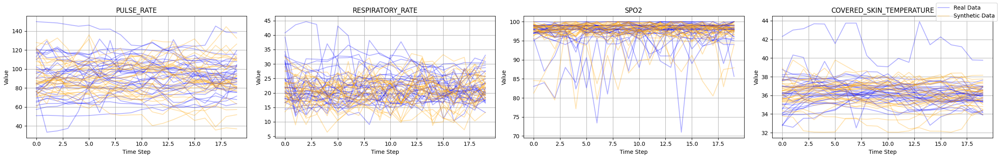

In [57]:
import matplotlib.lines as mlines

###############################
# 3) Spaghetti Plots
###############################
fig, axes = plt.subplots(1, 4, figsize=(25, 4))

for idx, vital in enumerate(vital_signs):
    ax = axes[idx]

    # Plot real data in blue
    for i in range(real_data.shape[0]):
        ax.plot(
            range(T),
            real_data[i, :, idx],
            alpha=0.3,
            color='blue'
        )
    # Plot synthetic data in orange
    for i in range(all_synthetic.shape[0]):
        ax.plot(
            range(T_synth),
            all_synthetic[i, :, idx],
            alpha=0.3,
            color='orange'
        )

    ax.set_title(vital)
    ax.set_xlabel("Time Step")
    ax.set_ylabel("Value")
    ax.grid(True)

# Create dummy artist objects just for the legend:
real_line = mlines.Line2D([], [], color='blue', alpha=0.3, label='Real Data')
synth_line = mlines.Line2D([], [], color='orange', alpha=0.3, label='Synthetic Data')

# Add a single legend for the whole figure:
fig.legend(handles=[real_line, synth_line], loc='upper right')

plt.tight_layout()
plt.show()

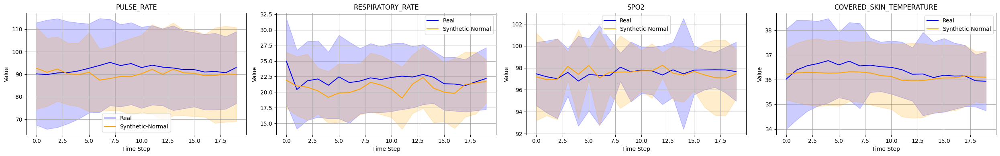

In [58]:
###############################
# 4) Mean ± Std Over Time
###############################
fig, axes = plt.subplots(1, 4, figsize=(25, 4))

time_axis = np.arange(T)  # same T for real and synthetic

for idx, vital in enumerate(vital_signs):
    ax = axes[idx]

    # Real
    real_means, real_stds = compute_mean_std_over_time(real_data[:, :, idx])
    plot_mean_std(ax, time_axis, real_means, real_stds,
                  label="Real", color='blue', alpha=0.2)

    # Synthetic
    synth_means, synth_stds = compute_mean_std_over_time(all_synthetic[:, :, idx])
    plot_mean_std(ax, time_axis, synth_means, synth_stds,
                  label="Synthetic-Normal", color='orange', alpha=0.2)

    ax.set_title(vital)
    ax.set_xlabel("Time Step")
    ax.set_ylabel("Value")
    ax.grid(True)
    ax.legend()

plt.tight_layout()
plt.show()

[PULSE_RATE] KS test on means => stat=0.205, p_value=0.217
[RESPIRATORY_RATE] KS test on means => stat=0.308, p_value=0.015
[SPO2] KS test on means => stat=0.170, p_value=0.417
[COVERED_SKIN_TEMPERATURE] KS test on means => stat=0.136, p_value=0.67


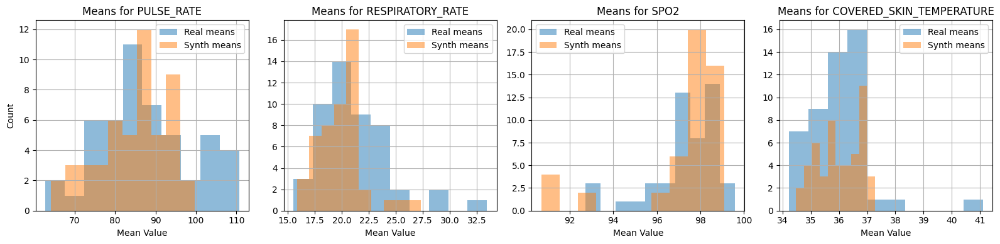

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp

def trajectory_features(trajectory):
    """
    trajectory shape: (T,) for a single vital sign
    Return mean, variance, or any other features you'd like.
    """
    return {
        "mean": np.mean(trajectory),
        "var": np.var(trajectory),
        # add more as needed
    }

# Create a figure with 4 subplots
fig, axes = plt.subplots(1, 4, figsize=(16, 4), sharey=False)

for idx, v_name in enumerate(vital_signs):
    ax = axes[idx]

    # Collect features from real data
    real_feats = []
    for i in range(real_data.shape[0]):
        feats = trajectory_features(real_data[i, :, idx])
        real_feats.append(feats)

    # Collect features from synthetic data
    synth_feats = []
    for i in range(all_synthetic.shape[0]):
        feats = trajectory_features(all_synthetic[i, :, idx])
        synth_feats.append(feats)

    # Extract the 'mean' values (or whichever feature you'd like)
    real_means = [d["mean"] for d in real_feats]
    synth_means = [d["mean"] for d in synth_feats]

    # Plot the distributions of means as overlapping histograms
    ax.hist(real_means, alpha=0.5, label="Real means")
    ax.hist(synth_means, alpha=0.5, label="Synth means")

    ax.set_title(f"Means for {v_name}")
    ax.set_xlabel("Mean Value")
    if idx == 0:
        ax.set_ylabel("Count")
    ax.grid(True)
    ax.legend()

    # Perform a KS test
    stat, p_value = ks_2samp(real_means, synth_means)
    print(f"[{v_name}] KS test on means => stat={stat:.3f}, p_value={p_value:.3g}")

plt.tight_layout()
plt.show()

# Diffusion

In [ ]:
# sampling setting

import math
import random
import numpy as np

intervention_success_rate = 0.7

# Example penalty functions:
def temperature_penalty(temp):
    return 0 if temp <= 38 else -math.exp(abs(temp - 38.0)/2)

def pulse_penalty(pulse):
    return 0 if pulse <= 120 else -math.exp(abs(pulse - 120)/17)

def respiratory_penalty(rr):
    return 0 if rr <= 30 else -math.exp(abs(rr - 30)/5)

def spo2_penalty(spo2):
    return 0 if spo2 >= 90 else -math.exp(abs(spo2 - 90)/4)

# The main reward function:
def reward_function(sign_dict):
    """
    sign_dict: e.g. {"PULSE_RATE": val, "RESPIRATORY_RATE": val, "SPO2": val, "COVERED_SKIN_TEMPERATURE": val}
    Returns a single numeric reward (negative if abnormal).
    """
    reward = 0
    if "COVERED_SKIN_TEMPERATURE" in sign_dict:
        reward += temperature_penalty(sign_dict["COVERED_SKIN_TEMPERATURE"])
    if "PULSE_RATE" in sign_dict:
        reward += pulse_penalty(sign_dict["PULSE_RATE"])
    if "RESPIRATORY_RATE" in sign_dict:
        reward += respiratory_penalty(sign_dict["RESPIRATORY_RATE"])
    if "SPO2" in sign_dict:
        reward += spo2_penalty(sign_dict["SPO2"])
    return reward

def improve_vital_signs3(sign_dict):
    """
    If random() < 0.7 and sign is abnormal => push sign value closer to normal range.
    This is a simple example; adapt as needed.
    """
    if random.random() < intervention_success_rate:
        # E.g. reduce or increase certain vitals by a random amount
        if "COVERED_SKIN_TEMPERATURE" in sign_dict and temperature_penalty(sign_dict["COVERED_SKIN_TEMPERATURE"]) < 0:
            sign_dict["COVERED_SKIN_TEMPERATURE"] -= np.random.normal(1.5, 0.5)
        if "PULSE_RATE" in sign_dict and pulse_penalty(sign_dict["PULSE_RATE"]) < 0:
            sign_dict["PULSE_RATE"] -= np.random.normal(15, 5)
        if "RESPIRATORY_RATE" in sign_dict and respiratory_penalty(sign_dict["RESPIRATORY_RATE"]) < 0:
            sign_dict["RESPIRATORY_RATE"] -= np.random.normal(10, 10/3)
        if "SPO2" in sign_dict and spo2_penalty(sign_dict["SPO2"]) < 0:
            sign_dict["SPO2"] += np.random.normal(3, 1)

    return sign_dict

In [ ]:
# create time-series

import pandas as pd

def create_time_series_dataset(pivot_df, vital_signs, sequence_length=50):
    """
    pivot_df: a DataFrame with columns [patient_id, generatedat] + vital_signs
    vital_signs: e.g. ["PULSE_RATE","RESPIRATORY_RATE","SPO2","COVERED_SKIN_TEMPERATURE"]
    sequence_length: how many time steps per snippet

    returns all_sequences of shape (num_sequences, sequence_length, len(vital_signs))
    """
    groups = pivot_df.groupby('patient_id')
    all_sequences = []

    for pid, group in groups:
        group = group.sort_values('generatedat')
        arr = group[vital_signs].values  # shape: (num_time_steps, len(vital_signs))

        # extract overlapping windows
        for start_idx in range(0, len(arr) - sequence_length + 1):
            snippet = arr[start_idx : start_idx + sequence_length]
            all_sequences.append(snippet)

    all_sequences = np.array(all_sequences)  # shape => (N, sequence_length, num_vitals)
    return all_sequences


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

class SimpleDiffusionModel(nn.Module):
    """
    Minimal diffusion model for 1D time series (toy example).
    """
    def __init__(self, num_features=4, hidden_dim=64):
        super(SimpleDiffusionModel, self).__init__()
        self.rnn = nn.LSTM(input_size=num_features, hidden_size=hidden_dim, batch_first=True)
        self.linear = nn.Linear(hidden_dim, num_features)

    def forward(self, x, t):
        """
        x: (batch, T, num_features)
        t: (batch,) -> not used in detail here
        """
        h, _ = self.rnn(x)
        output = self.linear(h)
        return output


def forward_diffusion(x0, timesteps=50):
    """
    For debugging/visualization, gradually adds noise from alpha=0..1.
    """
    eps = 1e-5
    noise_levels = torch.linspace(eps, 1.0 - eps, steps=timesteps, device=x0.device)
    x_noisy = []
    for t in range(timesteps):
        alpha = noise_levels[t]
        noise = torch.randn_like(x0)
        x_t = (1 - alpha)*x0 + alpha*noise
        x_noisy.append(x_t)
    return x_noisy

def diffusion_loss(model, x0, timesteps=50):
    """
    1) pick random t
    2) mix x0 with noise
    3) model predicts the noise
    """
    device = x0.device
    eps = 1e-5
    noise_levels = torch.linspace(eps, 1.0 - eps, steps=timesteps, device=device)

    t_idx = torch.randint(low=0, high=timesteps, size=(1,), device=device).item()
    alpha = noise_levels[t_idx]

    noise = torch.randn_like(x0)
    x_t = (1 - alpha)*x0 + alpha*noise

    noise_pred = model(x_t, torch.tensor([t_idx]*x0.size(0), device=device))
    loss = nn.MSELoss()(noise_pred, noise)
    return loss

def train_diffusion(model, data, num_epochs=5, batch_size=32):
    """
    data: shape (N, T, num_features)
    """
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    dataset = torch.utils.data.TensorDataset(torch.from_numpy(data).float())
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    for epoch in range(num_epochs):
        total_loss = 0.0
        for batch in dataloader:
            x0 = batch[0].to(device)
            optimizer.zero_grad()
            loss = diffusion_loss(model, x0, timesteps=50)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
        avg_loss = total_loss / len(dataloader)
        print(f"Epoch {epoch} - Loss: {avg_loss:.4f}")

def sample_diffusion(model, seq_len=50, num_samples=10):
    """
    The naive reverse-diffusion sampling:
      Start from random noise -> repeatedly subtract predicted noise
    """
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model.eval()
    with torch.no_grad():
        x_t = torch.randn(num_samples, seq_len, model.rnn.input_size, device=device)

        timesteps = 50
        eps = 1e-5
        noise_levels = torch.linspace(1.0 - eps, eps, steps=timesteps, device=device)

        step_scale = 0.01
        # clamp_val = 5.0

        for step_idx in range(timesteps):
            alpha = noise_levels[step_idx]
            noise_pred = model(x_t, torch.tensor([step_idx]*num_samples, device=device))
            x_t = x_t - step_scale * alpha * noise_pred
            x_t = torch.clamp(x_t, 0.0, 1.0)

        return x_t.cpu().numpy()  # shape => (num_samples, seq_len, num_features)

In [ ]:
def apply_interventions_in_raw_space(trajectories, vital_signs):
    """
    trajectories: shape (num_samples, seq_len, num_vitals) in RAW scale
    For each sample/time step, if reward<0 => improve_vital_signs3 in raw scale.
    Modifies 'trajectories' in place, returns it as well.
    """
    num_samples, seq_len, _ = trajectories.shape

    for i in range(num_samples):
        for t in range(seq_len):
            sign_dict = dict(zip(vital_signs, trajectories[i, t, :]))
            r = reward_function(sign_dict)  # must be raw-scale aware
            if r < 0:
                # Overwrite with improved values
                updated_dict = improve_vital_signs3(sign_dict)
                # e.g. if improve_vital_signs3 expects raw scale
                # store them back
                for idx, vs in enumerate(vital_signs):
                    trajectories[i, t, idx] = updated_dict[vs]
    return trajectories

In [ ]:
import matplotlib.pyplot as plt

def plot_spaghetti(real_data, synth_data, vital_signs):
    """
    real_data: shape (N_real, T, num_features)
    synth_data: shape (N_synth, T, num_features)
    """
    T = real_data.shape[1]
    fig, axes = plt.subplots(1, len(vital_signs), figsize=(6*len(vital_signs), 4))

    for idx, vs in enumerate(vital_signs):
        ax = axes[idx]
        # Plot real
        for i in range(real_data.shape[0]):
            ax.plot(range(T), real_data[i, :, idx], alpha=0.3, color='blue')
        # Plot synthetic
        for i in range(synth_data.shape[0]):
            ax.plot(range(T), synth_data[i, :, idx], alpha=0.3, color='orange')
        ax.set_title(vs)
        ax.set_xlabel("Time Step")
        ax.set_ylabel("Value")
        ax.grid(True)

    # Single legend
    real_line = plt.Line2D([], [], color='blue', alpha=0.3, label='Real')
    synth_line = plt.Line2D([], [], color='orange', alpha=0.3, label='Synthetic')
    fig.legend(handles=[real_line, synth_line], loc='upper right')

    plt.tight_layout()
    plt.show()

def compute_mean_std_over_time(data_array):
    """
    data_array: shape (num_trajectories, T)
    Return (mean, std) each shape (T,)
    """
    means = data_array.mean(axis=0)
    stds  = data_array.std(axis=0)
    return means, stds

def plot_mean_std(ax, time_axis, mean, std, label="", color="blue", alpha=0.2):
    ax.plot(time_axis, mean, label=label, color=color)
    ax.fill_between(time_axis, mean-std, mean+std, color=color, alpha=alpha)

def plot_mean_std_comparison(real_data, synth_data, vital_signs):
    T = real_data.shape[1]
    time_axis = np.arange(T)
    fig, axes = plt.subplots(1, len(vital_signs), figsize=(6*len(vital_signs), 4))

    for idx, vs in enumerate(vital_signs):
        ax = axes[idx]
        # Real
        real_means, real_stds = compute_mean_std_over_time(real_data[:, :, idx])
        plot_mean_std(ax, time_axis, real_means, real_stds, label="Real", color='blue', alpha=0.2)
        # Synthetic
        synth_means, synth_stds = compute_mean_std_over_time(synth_data[:, :, idx])
        plot_mean_std(ax, time_axis, synth_means, synth_stds, label="Synthetic", color='orange', alpha=0.2)

        ax.set_title(vs)
        ax.set_xlabel("Time Step")
        ax.set_ylabel("Value")
        ax.grid(True)
        ax.legend()

    plt.tight_layout()
    plt.show()


all_data_raw shape: (705, 50, 4)
Epoch 0 - Loss: 0.9672
Epoch 1 - Loss: 0.7583
Epoch 2 - Loss: 0.4553
Epoch 3 - Loss: 0.2426
Epoch 4 - Loss: 0.2820
Epoch 5 - Loss: 0.3927
Epoch 6 - Loss: 0.2067
Epoch 7 - Loss: 0.2243
Epoch 8 - Loss: 0.3298
Epoch 9 - Loss: 0.2476
Epoch 10 - Loss: 0.1864
Epoch 11 - Loss: 0.2569
Epoch 12 - Loss: 0.2265
Epoch 13 - Loss: 0.2909
Epoch 14 - Loss: 0.1511
Epoch 15 - Loss: 0.2668
Epoch 16 - Loss: 0.1692
Epoch 17 - Loss: 0.1988
Epoch 18 - Loss: 0.1855
Epoch 19 - Loss: 0.1521
Epoch 20 - Loss: 0.1896
Epoch 21 - Loss: 0.1965
Epoch 22 - Loss: 0.1188
Epoch 23 - Loss: 0.1604
Epoch 24 - Loss: 0.1636
Epoch 25 - Loss: 0.1880
Epoch 26 - Loss: 0.1725
Epoch 27 - Loss: 0.1438
Epoch 28 - Loss: 0.1746
Epoch 29 - Loss: 0.1496
synthetic_data_norm shape: (40, 50, 4)
synthetic_data_raw shape: (40, 50, 4)


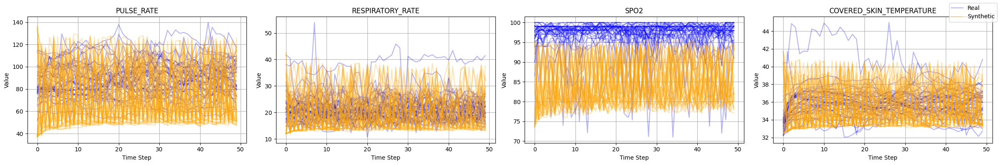

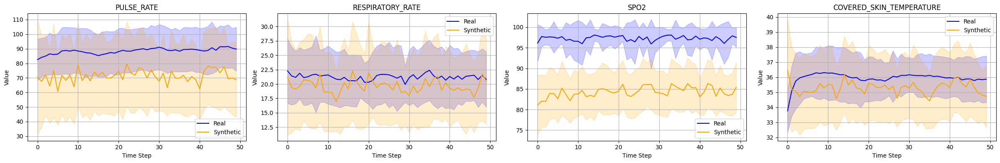

In [ ]:
if __name__ == "__main__":
    import pickle
    import numpy as np
    import random

    # A) Load preprocessed pivot_df (raw scale assumed)
    with open("pivot_df_raw.pkl", "rb") as f:
        pivot_df = pickle.load(f)

    pivot_df['generatedat'] = pd.to_datetime(pivot_df['generatedat'])
    vital_signs = ["PULSE_RATE","RESPIRATORY_RATE","SPO2","COVERED_SKIN_TEMPERATURE"]

    # B) Create time-series dataset from raw pivot data
    #    e.g. each snippet is 50 time steps
    all_data_raw = create_time_series_dataset(pivot_df, vital_signs, sequence_length=50)
    print("all_data_raw shape:", all_data_raw.shape)  # e.g. (N, 50, 4)

    ######################################################
    # 1) Compute min/max for each feature across all_data
    ######################################################
    num_vitals = len(vital_signs)
    flattened = all_data_raw.reshape(-1, num_vitals)
    min_vals = flattened.min(axis=0)  # shape (4,)
    max_vals = flattened.max(axis=0)  # shape (4,)

    def minmax_transform(value, minv, maxv):
        return (value - minv) / (maxv - minv + 1e-8)

    def minmax_inverse(value, minv, maxv):
        return value*(maxv - minv + 1e-8) + minv

    ########################################################
    # 2) Transform all_data_raw => all_data_norm in [0..1]
    ########################################################
    all_data_norm = np.zeros_like(all_data_raw)
    for i in range(num_vitals):
        all_data_norm[..., i] = minmax_transform(all_data_raw[..., i], min_vals[i], max_vals[i])

    ########################################################
    # 3) Train diffusion on normalized data
    ########################################################
    model = SimpleDiffusionModel(num_features=num_vitals, hidden_dim=256)
    train_diffusion(model, all_data_norm, num_epochs=30, batch_size=32)

    ########################################################
    # 4) Sample from diffusion (NO interventions in normalized space)
    #    We'll produce 40 synthetic trajectories, each 50 time steps
    ########################################################
    synthetic_data_norm = sample_diffusion(
        model,
        seq_len=50,
        num_samples=40
    )
    print("synthetic_data_norm shape:", synthetic_data_norm.shape)  # (40, 50, 4)

    ########################################################
    # 5) Invert the min-max transform => synthetic_data_raw
    ########################################################
    synthetic_data_raw = np.zeros_like(synthetic_data_norm)
    for i in range(num_vitals):
        synthetic_data_raw[..., i] = minmax_inverse(
            synthetic_data_norm[..., i],
            min_vals[i],
            max_vals[i]
        )

    ########################################################
    # 6) Apply Interventions in RAW scale
    ########################################################
    # If your 'improve_vital_signs3' and 'reward_function'
    # are truly meant for raw scale, do it now:
    synthetic_data_raw = apply_interventions_in_raw_space(synthetic_data_raw, vital_signs)
    print("synthetic_data_raw shape:", synthetic_data_raw.shape)  # (40, 50, 4)

    ########################################################
    # 7) Grab 40 real trajectories of length 50 from pivot_df
    ########################################################
    grouped = pivot_df.groupby('patient_id')
    MIN_LENGTH = 50
    long_enough_ids = [pid for pid, grp in grouped if len(grp) >= MIN_LENGTH]
    real_ids = random.sample(long_enough_ids, min(40, len(long_enough_ids)))
    real_data = np.zeros((len(real_ids), 50, num_vitals))

    for i, pid in enumerate(real_ids):
        subdf = grouped.get_group(pid).copy()
        subdf.sort_values('generatedat', inplace=True)
        subdf.reset_index(drop=True, inplace=True)
        subdf = subdf.iloc[:50]  # up to 50 points
        for v_idx, vs in enumerate(vital_signs):
            real_data[i, :len(subdf), v_idx] = subdf[vs].values

    ########################################################
    # 8) Plot Spaghetti (raw scale)
    ########################################################
    plot_spaghetti(real_data, synthetic_data_raw, vital_signs)

    ########################################################
    # 9) Plot mean ± std (raw scale)
    ########################################################
    plot_mean_std_comparison(real_data, synthetic_data_raw, vital_signs)


# DDPM - Diffusion

all_data_raw shape: (7459, 50, 4)
Epoch 0/20 - Loss: 0.6659
Epoch 1/20 - Loss: 0.2458
Epoch 2/20 - Loss: 0.1878
Epoch 3/20 - Loss: 0.1734
Epoch 4/20 - Loss: 0.1618
Epoch 5/20 - Loss: 0.1563
Epoch 6/20 - Loss: 0.1505
Epoch 7/20 - Loss: 0.1496
Epoch 8/20 - Loss: 0.1471
Epoch 9/20 - Loss: 0.1433
Epoch 10/20 - Loss: 0.1411
Epoch 11/20 - Loss: 0.1447
Epoch 12/20 - Loss: 0.1401
Epoch 13/20 - Loss: 0.1432
Epoch 14/20 - Loss: 0.1374
Epoch 15/20 - Loss: 0.1360
Epoch 16/20 - Loss: 0.1383
Epoch 17/20 - Loss: 0.1367
Epoch 18/20 - Loss: 0.1348
Epoch 19/20 - Loss: 0.1348
samples_norm shape: (40, 100, 4)
Final synthetic data shape: (40, 100, 4)


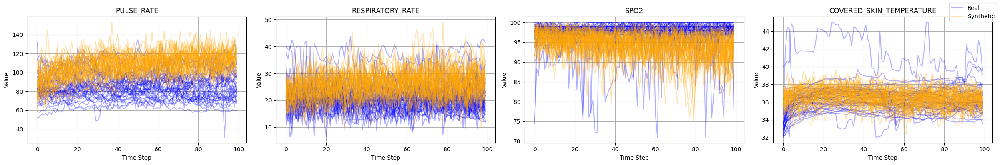

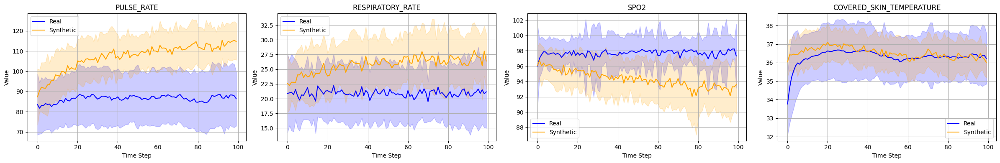

In [ ]:
import math
import random
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

########################################
#   INTERVENTION & REWARD FUNCTIONS
########################################
def temperature_penalty(temp):
    return 0 if temp <= 38 else -math.exp(abs(temp - 38.0)/2)

def pulse_penalty(pulse):
    return 0 if pulse <= 120 else -math.exp(abs(pulse - 120) / 17)

def respiratory_penalty(rr):
    return 0 if rr <= 30 else -math.exp(abs(rr - 30) / 5)

def spo2_penalty(spo2):
    return 0 if spo2 >= 90 else -math.exp(abs(spo2 - 90) / 4)

def reward_function(sign_dict):
    """Compute a reward (negative if abnormal) given raw vital values."""
    reward = 0
    if "COVERED_SKIN_TEMPERATURE" in sign_dict:
        reward += temperature_penalty(sign_dict["COVERED_SKIN_TEMPERATURE"])
    if "PULSE_RATE" in sign_dict:
        reward += pulse_penalty(sign_dict["PULSE_RATE"])
    if "RESPIRATORY_RATE" in sign_dict:
        reward += respiratory_penalty(sign_dict["RESPIRATORY_RATE"])
    if "SPO2" in sign_dict:
        reward += spo2_penalty(sign_dict["SPO2"])
    return reward

intervention_success_rate = 0.7

def improve_vital_signs3(sign_dict):
    """
    If a random chance succeeds and a sign is abnormal, adjust it towards normal.
    (Adjust the magnitudes as needed for raw-scale values.)
    """
    if random.random() < intervention_success_rate:
        if "COVERED_SKIN_TEMPERATURE" in sign_dict and temperature_penalty(sign_dict["COVERED_SKIN_TEMPERATURE"]) < 0:
            sign_dict["COVERED_SKIN_TEMPERATURE"] -= np.random.normal(0.5, 0.2)
        if "PULSE_RATE" in sign_dict and pulse_penalty(sign_dict["PULSE_RATE"]) < 0:
            sign_dict["PULSE_RATE"] -= np.random.normal(5, 2)
        if "RESPIRATORY_RATE" in sign_dict and respiratory_penalty(sign_dict["RESPIRATORY_RATE"]) < 0:
            sign_dict["RESPIRATORY_RATE"] -= np.random.normal(2, 1)
        if "SPO2" in sign_dict and spo2_penalty(sign_dict["SPO2"]) < 0:
            sign_dict["SPO2"] += np.random.normal(1, 0.5)
    return sign_dict

def apply_interventions_in_raw_space(trajectories, vital_signs):
    """
    For each sample and time step in raw-scale trajectories,
    if reward < 0, apply improve_vital_signs3.
    trajectories: (num_samples, seq_len, num_vitals)
    """
    num_samples, seq_len, _ = trajectories.shape
    for i in range(num_samples):
        for t in range(seq_len):
            sign_dict = dict(zip(vital_signs, trajectories[i, t, :]))
            r = reward_function(sign_dict)
            if r < 0:
                updated = improve_vital_signs3(sign_dict)
                for idx, vs in enumerate(vital_signs):
                    trajectories[i, t, idx] = updated[vs]
    return trajectories


def minmax_transform(value, minv, maxv):
    return (value - minv) / (maxv - minv + 1e-8)

def minmax_inverse(value, minv, maxv):
    return value * (maxv - minv + 1e-8) + minv

########################################
# DDPM TIME SERIES MODEL WITH TIMESTEP EMBEDDING
########################################
class TimestepEmbed(nn.Module):
    def __init__(self, embed_dim=64):
        super().__init__()
        self.lin1 = nn.Linear(1, embed_dim)
        self.lin2 = nn.Linear(embed_dim, embed_dim)
    def forward(self, t):
        # t: (batch,)
        t = t.unsqueeze(1).float()  # (batch, 1)
        x = torch.relu(self.lin1(t))
        x = torch.relu(self.lin2(x))
        return x

class DDPMTimeSeriesModel(nn.Module):
    def __init__(self, num_features=4, hidden_dim=64, embed_dim=64):
        super().__init__()
        self.t_embed = TimestepEmbed(embed_dim=embed_dim)
        self.rnn = nn.LSTM(input_size=num_features + embed_dim,
                           hidden_size=hidden_dim,
                           batch_first=True)
        self.linear = nn.Linear(hidden_dim, num_features)
    def forward(self, x, t):
        # x: (batch, T, num_features)
        # t: (batch,)
        t_emb = self.t_embed(t)            # (batch, embed_dim)
        t_emb = t_emb.unsqueeze(1).expand(-1, x.size(1), -1)  # (batch, T, embed_dim)
        x_in = torch.cat([x, t_emb], dim=-1)  # (batch, T, num_features+embed_dim)
        h, _ = self.rnn(x_in)
        eps_pred = self.linear(h)
        return eps_pred

########################################
#  DDPM Training and Sampling Helpers
########################################
def make_beta_schedule(num_timesteps=50, beta_start=1e-4, beta_end=2e-2):
    return torch.linspace(beta_start, beta_end, num_timesteps)

class DDPMTrainer:
    def __init__(self, model, num_timesteps=50, beta_start=1e-4, beta_end=2e-2):
        self.model = model
        self.num_timesteps = num_timesteps
        self.beta = make_beta_schedule(num_timesteps, beta_start, beta_end)
        self.alpha = 1.0 - self.beta
        self.alpha_bar = torch.cumprod(self.alpha, dim=0)
    def train(self, data, num_epochs=5, batch_size=32):
        device = "cuda" if torch.cuda.is_available() else "cpu"
        self.model.to(device)
        self.sqrt_alpha_bar = torch.sqrt(self.alpha_bar).to(device)
        self.sqrt_one_minus_alpha_bar = torch.sqrt(1.0 - self.alpha_bar).to(device)
        optimizer = optim.Adam(self.model.parameters(), lr=1e-3)
        dataset = torch.utils.data.TensorDataset(torch.from_numpy(data).float())
        loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)
        for epoch in range(num_epochs):
            total_loss = 0
            for batch_x0, in loader:
                batch_x0 = batch_x0.to(device)
                optimizer.zero_grad()
                bsz = batch_x0.size(0)
                t = torch.randint(0, self.num_timesteps, (bsz,), device=device)
                # Forward diffusion: x_t = sqrt(alpha_bar[t]) * x0 + sqrt(1-alpha_bar[t]) * noise
                x_t, eps = forward_diffusion_sample(
                    batch_x0, t,
                    self.sqrt_alpha_bar, self.sqrt_one_minus_alpha_bar
                )
                eps_pred = self.model(x_t, t)
                loss = nn.MSELoss()(eps_pred, eps)
                loss.backward()
                optimizer.step()
                total_loss += loss.item()
            avg_loss = total_loss / len(loader)
            print(f"Epoch {epoch}/{num_epochs} - Loss: {avg_loss:.4f}")

def forward_diffusion_sample(x0, t, sqrt_alpha_bar, sqrt_one_minus_alpha_bar):
    bsz = x0.size(0)
    sqrt_ab = sqrt_alpha_bar[t].view(-1,1,1)
    sqrt_1m_ab = sqrt_one_minus_alpha_bar[t].view(-1,1,1)
    eps = torch.randn_like(x0)
    x_t = sqrt_ab * x0 + sqrt_1m_ab * eps
    return x_t, eps

def ddpm_sample(model, trainer, shape=(10,50,4), device="cpu"):
    model.eval()
    x_t = torch.randn(shape, device=device)
    with torch.no_grad():
        for t_step in reversed(range(trainer.num_timesteps)):
            t_tensor = torch.tensor([t_step]*shape[0], device=device)
            beta_t = trainer.beta[t_step].to(device)
            alpha_t = trainer.alpha[t_step].to(device)
            alpha_bar_t = trainer.alpha_bar[t_step].to(device)
            eps_pred = model(x_t, t_tensor)
            alpha_t_sqrt = torch.sqrt(alpha_t)
            one_minus_alpha_bar_t = 1.0 - alpha_bar_t
            x0_est = (1.0 / alpha_t_sqrt) * (x_t - (1.0 - alpha_t)/torch.sqrt(one_minus_alpha_bar_t + 1e-8)*eps_pred)
            if t_step > 0:
                sigma_t = torch.sqrt(beta_t)
                z = torch.randn_like(x_t)
                x_t = x0_est + sigma_t * z
            else:
                x_t = x0_est
            # Clamp to [0,1] if training data is normalized
            x_t = torch.clamp(x_t, 0.0, 1.0)
    return x_t.cpu().numpy()

########################################
#  Plotting Functions
########################################
def plot_spaghetti(real_data, synth_data, vital_signs):
    """
    real_data: (N_real, T, num_features)
    synth_data: (N_synth, T, num_features)
    """
    T = real_data.shape[1]
    fig, axes = plt.subplots(1, len(vital_signs), figsize=(6*len(vital_signs), 4))
    for idx, vs in enumerate(vital_signs):
        ax = axes[idx]
        for i in range(real_data.shape[0]):
            ax.plot(range(T), real_data[i, :, idx], alpha=0.3, color='blue')
        for i in range(synth_data.shape[0]):
            ax.plot(range(T), synth_data[i, :, idx], alpha=0.3, color='orange')
        ax.set_title(vs)
        ax.set_xlabel("Time Step")
        ax.set_ylabel("Value")
        ax.grid(True)
    real_line = plt.Line2D([], [], color='blue', alpha=0.3, label='Real')
    synth_line = plt.Line2D([], [], color='orange', alpha=0.3, label='Synthetic')
    fig.legend(handles=[real_line, synth_line], loc='upper right')
    plt.tight_layout()
    plt.show()

def compute_mean_std_over_time(data_array):
    means = data_array.mean(axis=0)
    stds = data_array.std(axis=0)
    return means, stds

def plot_mean_std(ax, time_axis, mean, std, label="", color="blue", alpha=0.2):
    ax.plot(time_axis, mean, label=label, color=color)
    ax.fill_between(time_axis, mean-std, mean+std, color=color, alpha=alpha)

def plot_mean_std_comparison(real_data, synth_data, vital_signs):
    T = real_data.shape[1]
    time_axis = np.arange(T)
    fig, axes = plt.subplots(1, len(vital_signs), figsize=(6*len(vital_signs), 4))
    for idx, vs in enumerate(vital_signs):
        ax = axes[idx]
        real_means, real_stds = compute_mean_std_over_time(real_data[:, :, idx])
        plot_mean_std(ax, time_axis, real_means, real_stds, label="Real", color='blue', alpha=0.2)
        synth_means, synth_stds = compute_mean_std_over_time(synth_data[:, :, idx])
        plot_mean_std(ax, time_axis, synth_means, synth_stds, label="Synthetic", color='orange', alpha=0.2)
        ax.set_title(vs)
        ax.set_xlabel("Time Step")
        ax.set_ylabel("Value")
        ax.grid(True)
        ax.legend()
    plt.tight_layout()
    plt.show()

########################################
#  Main Script: Data, Training, Sampling, Plotting
########################################
if __name__ == "__main__":
    # Assume you have a pivot_df in raw scale
    with open("pivot_df.pkl", "rb") as f:
        pivot_df = pickle.load(f)
    pivot_df['generatedat'] = pd.to_datetime(pivot_df['generatedat'])
    vital_signs = ["PULSE_RATE", "RESPIRATORY_RATE", "SPO2", "COVERED_SKIN_TEMPERATURE"]

    # Create time-series dataset (raw scale)
    all_data_raw = create_time_series_dataset(pivot_df, vital_signs, sequence_length=50)
    print("all_data_raw shape:", all_data_raw.shape)

    # Compute min/max for each vital sign (from raw data)
    num_vitals = len(vital_signs)
    flattened = all_data_raw.reshape(-1, num_vitals)
    min_vals = flattened.min(axis=0)
    max_vals = flattened.max(axis=0)

    # Transform raw data to normalized [0,1]
    all_data_norm = np.zeros_like(all_data_raw)
    for i in range(num_vitals):
        all_data_norm[..., i] = minmax_transform(all_data_raw[..., i], min_vals[i], max_vals[i])

    # Train the diffusion model on normalized data
    model = DDPMTimeSeriesModel(num_features=num_vitals, hidden_dim=64, embed_dim=64)
    trainer = DDPMTrainer(model, num_timesteps=50, beta_start=1e-4, beta_end=2e-2)
    trainer.train(all_data_norm, num_epochs=20, batch_size=32)

    # Sample from the diffusion model (normalized outputs)
    samples_norm = ddpm_sample(model, trainer, shape=(40, 100, num_vitals), device="cuda" if torch.cuda.is_available() else "cpu")
    print("samples_norm shape:", samples_norm.shape)

    # Invert normalization => synthetic data in raw scale
    synthetic_data_raw = np.zeros_like(samples_norm)
    for i in range(num_vitals):
        synthetic_data_raw[..., i] = minmax_inverse(samples_norm[..., i], min_vals[i], max_vals[i])

    # Apply interventions in raw scale
    synthetic_data_raw = apply_interventions_in_raw_space(synthetic_data_raw, vital_signs)
    print("Final synthetic data shape:", synthetic_data_raw.shape)

    # Grab 40 real trajectories of length 50 from pivot_df (raw scale)
    grouped = pivot_df.groupby('patient_id')
    MIN_LENGTH = 100
    long_enough_ids = [pid for pid, grp in grouped if len(grp) >= MIN_LENGTH]
    real_ids = random.sample(long_enough_ids, min(40, len(long_enough_ids)))
    real_data = np.zeros((len(real_ids), 100, num_vitals))
    for i, pid in enumerate(real_ids):
        subdf = grouped.get_group(pid).copy()
        subdf.sort_values('generatedat', inplace=True)
        subdf.reset_index(drop=True, inplace=True)
        subdf = subdf.iloc[:100]
        for v_idx, vs in enumerate(vital_signs):
            real_data[i, :len(subdf), v_idx] = subdf[vs].values

    # Plot spaghetti
    plot_spaghetti(real_data, synthetic_data_raw, vital_signs)

    # Plot mean ± std comparison
    plot_mean_std_comparison(real_data, synthetic_data_raw, vital_signs)

# GAN

all_data_raw shape: (705, 50, 4)
[Epoch 0/20] D_loss: 1.3858, G_loss: 0.6496
[Epoch 1/20] D_loss: 1.3769, G_loss: 0.6550
[Epoch 2/20] D_loss: 1.3677, G_loss: 0.6600
[Epoch 3/20] D_loss: 1.3584, G_loss: 0.6650
[Epoch 4/20] D_loss: 1.3484, G_loss: 0.6699
[Epoch 5/20] D_loss: 1.3382, G_loss: 0.6748
[Epoch 6/20] D_loss: 1.3272, G_loss: 0.6792
[Epoch 7/20] D_loss: 1.3153, G_loss: 0.6832
[Epoch 8/20] D_loss: 1.3079, G_loss: 0.6810
[Epoch 9/20] D_loss: 1.3243, G_loss: 0.6596
[Epoch 10/20] D_loss: 1.3920, G_loss: 0.6181
[Epoch 11/20] D_loss: 1.4203, G_loss: 0.6227
[Epoch 12/20] D_loss: 1.3954, G_loss: 0.6658
[Epoch 13/20] D_loss: 1.3601, G_loss: 0.7192
[Epoch 14/20] D_loss: 1.3209, G_loss: 0.7843
[Epoch 15/20] D_loss: 1.2771, G_loss: 0.8476
[Epoch 16/20] D_loss: 1.2343, G_loss: 0.8932
[Epoch 17/20] D_loss: 1.2007, G_loss: 0.9599
[Epoch 18/20] D_loss: 1.2648, G_loss: 1.0356
[Epoch 19/20] D_loss: 1.4162, G_loss: 0.9627


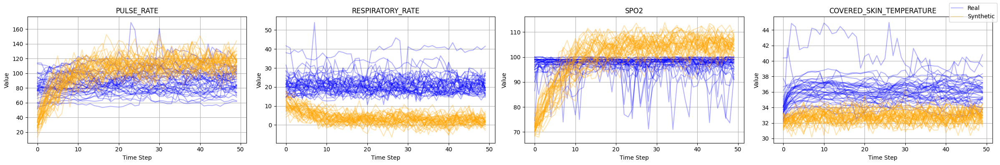

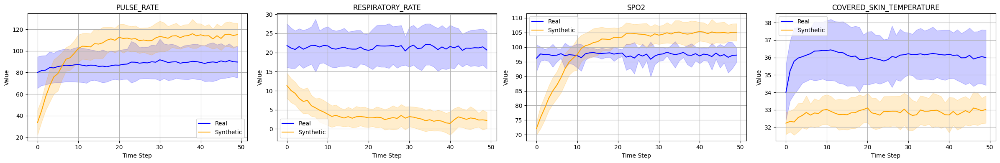

In [ ]:
import math
import random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

###############################################################################
# 1) Intervention & Reward
###############################################################################
def temperature_penalty(temp):
    return 0 if temp <= 38 else -math.exp(abs(temp - 38.0)/2)

def pulse_penalty(pulse):
    return 0 if pulse <= 120 else -math.exp(abs(pulse - 120) / 17)

def respiratory_penalty(rr):
    return 0 if rr <= 30 else -math.exp(abs(rr - 30) / 5)

def spo2_penalty(spo2):
    return 0 if spo2 >= 90 else -math.exp(abs(spo2 - 90) / 4)

def reward_function(sign_dict):
    """Compute a reward (negative if abnormal) given raw vital values."""
    reward = 0
    if "COVERED_SKIN_TEMPERATURE" in sign_dict:
        reward += temperature_penalty(sign_dict["COVERED_SKIN_TEMPERATURE"])
    if "PULSE_RATE" in sign_dict:
        reward += pulse_penalty(sign_dict["PULSE_RATE"])
    if "RESPIRATORY_RATE" in sign_dict:
        reward += respiratory_penalty(sign_dict["RESPIRATORY_RATE"])
    if "SPO2" in sign_dict:
        reward += spo2_penalty(sign_dict["SPO2"])
    return reward

intervention_success_rate = 0.7

def improve_vital_signs3(sign_dict):
    if random.random() < intervention_success_rate:
        if "COVERED_SKIN_TEMPERATURE" in sign_dict and temperature_penalty(sign_dict["COVERED_SKIN_TEMPERATURE"]) < 0:
            sign_dict["COVERED_SKIN_TEMPERATURE"] -= np.random.normal(0.5, 0.2)
        if "PULSE_RATE" in sign_dict and pulse_penalty(sign_dict["PULSE_RATE"]) < 0:
            sign_dict["PULSE_RATE"] -= np.random.normal(5, 2)
        if "RESPIRATORY_RATE" in sign_dict and respiratory_penalty(sign_dict["RESPIRATORY_RATE"]) < 0:
            sign_dict["RESPIRATORY_RATE"] -= np.random.normal(2, 1)
        if "SPO2" in sign_dict and spo2_penalty(sign_dict["SPO2"]) < 0:
            sign_dict["SPO2"] += np.random.normal(1, 0.5)
    return sign_dict

def apply_interventions_in_raw_space(trajectories, vital_signs):
    """
    For each sample/time step in raw-scale trajectories,
    if reward < 0, apply improve_vital_signs3.
    trajectories: (num_samples, seq_len, num_vitals)
    """
    num_samples, seq_len, _ = trajectories.shape
    for i in range(num_samples):
        for t in range(seq_len):
            sign_dict = dict(zip(vital_signs, trajectories[i, t, :]))
            r = reward_function(sign_dict)
            if r < 0:
                updated = improve_vital_signs3(sign_dict)
                for idx, vs in enumerate(vital_signs):
                    trajectories[i, t, idx] = updated[vs]
    return trajectories

###############################################################################
# 2) Min-Max Transform
###############################################################################
def minmax_transform(value, minv, maxv):
    return (value - minv) / (maxv - minv + 1e-8)

def minmax_inverse(value, minv, maxv):
    return value * (maxv - minv + 1e-8) + minv

###############################################################################
# 3) Simple RNN-based Generator & Discriminator
###############################################################################
class RNNGenerator(nn.Module):
    """
    Takes random noise z of shape (batch, seq_len, latent_dim) and outputs
    synthetic time-series of shape (batch, seq_len, input_dim).
    """
    def __init__(self, latent_dim, hidden_dim, output_dim):
        super().__init__()
        self.rnn = nn.LSTM(input_size=latent_dim, hidden_size=hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, z):
        # z: (batch, seq_len, latent_dim)
        h, _ = self.rnn(z)  # shape => (batch, seq_len, hidden_dim)
        x_hat = self.fc(h)  # shape => (batch, seq_len, output_dim)
        return x_hat

class RNNDiscriminator(nn.Module):
    """
    Receives a time-series of shape (batch, seq_len, input_dim),
    outputs a single real/fake score per sequence or a sequence of scores.
    We'll produce a single final output per sequence (like a "global" real/fake).
    """
    def __init__(self, input_dim, hidden_dim):
        super().__init__()
        self.rnn = nn.LSTM(input_size=input_dim, hidden_size=hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        # x: (batch, seq_len, input_dim)
        # We'll use only the final hidden state to get a single scalar
        # or the last time step from the LSTM output
        h, (h_n, c_n) = self.rnn(x)
        # h_n: shape => (1, batch, hidden_dim)
        # we'll pass h_n through a fc
        y_hat = self.fc(h_n.squeeze(0))  # shape => (batch, 1)
        return y_hat  # single scalar per sequence

###############################################################################
# 4) Simple RNN-GAN Class
###############################################################################
class RNNGAN:
    """
    A simpler RNN-based GAN for time-series. No extra embedder or supervisor,
    just a generator & discriminator.
    """
    def __init__(self, input_dim, hidden_dim=32, latent_dim=16, seq_len=50, device='cpu'):
        self.input_dim = input_dim
        self.hidden_dim = hidden_dim
        self.latent_dim = latent_dim
        self.seq_len = seq_len
        self.device = device

        # build
        self.generator = RNNGenerator(latent_dim, hidden_dim, input_dim).to(device)
        self.discriminator = RNNDiscriminator(input_dim, hidden_dim).to(device)

        # optim
        self.optimG = optim.Adam(self.generator.parameters(), lr=1e-4)
        self.optimD = optim.Adam(self.discriminator.parameters(), lr=1e-4)

        self.bce = nn.BCEWithLogitsLoss()

    def train(self, data, batch_size=32, epochs=10):
        dataset = torch.utils.data.TensorDataset(torch.from_numpy(data).float())
        loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

        for epoch in range(epochs):
            d_loss_total, g_loss_total = 0, 0
            for batch_x, in loader:
                batch_x = batch_x.to(self.device)  # shape => (bsz, seq_len, input_dim)
                bsz = batch_x.size(0)

                # --------------------
                # 1) Update Discriminator
                # --------------------
                self.optimD.zero_grad()

                # real => label=1
                y_real = self.discriminator(batch_x)
                valid = torch.ones_like(y_real)
                d_real_loss = self.bce(y_real, valid)

                # fake => label=0
                z = torch.randn(bsz, self.seq_len, self.latent_dim, device=self.device)
                x_fake = self.generator(z)
                y_fake = self.discriminator(x_fake.detach())
                fake = torch.zeros_like(y_fake)
                d_fake_loss = self.bce(y_fake, fake)

                d_loss = d_real_loss + d_fake_loss
                d_loss.backward()
                self.optimD.step()

                # --------------------
                # 2) Update Generator
                # --------------------
                self.optimG.zero_grad()

                z2 = torch.randn(bsz, self.seq_len, self.latent_dim, device=self.device)
                x_fake2 = self.generator(z2)
                y_fake2 = self.discriminator(x_fake2)
                # generator wants y_fake2 => label=1
                g_loss = self.bce(y_fake2, valid)  # same 'valid' as real

                g_loss.backward()
                self.optimG.step()

                d_loss_total += d_loss.item()
                g_loss_total += g_loss.item()

            print(f"[Epoch {epoch}/{epochs}] D_loss: {d_loss_total/len(loader):.4f}, G_loss: {g_loss_total/len(loader):.4f}")

    def sample(self, num_samples=10):
        """
        Return shape => (num_samples, seq_len, input_dim)
        """
        z = torch.randn(num_samples, self.seq_len, self.latent_dim, device=self.device)
        with torch.no_grad():
            x_fake = self.generator(z)
        return x_fake.cpu().numpy()

###############################################################################
# 5) Plotting code
###############################################################################
def plot_spaghetti(real_data, synth_data, vital_signs):
    T = real_data.shape[1]
    fig, axes = plt.subplots(1, len(vital_signs), figsize=(6*len(vital_signs), 4))
    for idx, vs in enumerate(vital_signs):
        ax = axes[idx]
        for i in range(real_data.shape[0]):
            ax.plot(range(T), real_data[i, :, idx], alpha=0.3, color='blue')
        for i in range(synth_data.shape[0]):
            ax.plot(range(T), synth_data[i, :, idx], alpha=0.3, color='orange')
        ax.set_title(vs)
        ax.set_xlabel("Time Step")
        ax.set_ylabel("Value")
        ax.grid(True)
    real_line = plt.Line2D([], [], color='blue', alpha=0.3, label='Real')
    synth_line = plt.Line2D([], [], color='orange', alpha=0.3, label='Synthetic')
    fig.legend(handles=[real_line, synth_line], loc='upper right')
    plt.tight_layout()
    plt.show()

def compute_mean_std_over_time(data_array):
    means = data_array.mean(axis=0)
    stds = data_array.std(axis=0)
    return means, stds

def plot_mean_std(ax, time_axis, mean, std, label="", color="blue", alpha=0.2):
    ax.plot(time_axis, mean, label=label, color=color)
    ax.fill_between(time_axis, mean-std, mean+std, color=color, alpha=alpha)

def plot_mean_std_comparison(real_data, synth_data, vital_signs):
    T = real_data.shape[1]
    time_axis = np.arange(T)
    fig, axes = plt.subplots(1, len(vital_signs), figsize=(6*len(vital_signs), 4))
    for idx, vs in enumerate(vital_signs):
        ax = axes[idx]
        real_means, real_stds = compute_mean_std_over_time(real_data[:, :, idx])
        plot_mean_std(ax, time_axis, real_means, real_stds, label="Real", color='blue', alpha=0.2)
        synth_means, synth_stds = compute_mean_std_over_time(synth_data[:, :, idx])
        plot_mean_std(ax, time_axis, synth_means, synth_stds, label="Synthetic", color='orange', alpha=0.2)
        ax.set_title(vs)
        ax.set_xlabel("Time Step")
        ax.set_ylabel("Value")
        ax.grid(True)
        ax.legend()
    plt.tight_layout()
    plt.show()

###############################################################################
# 6) Example Main
###############################################################################
if __name__ == "__main__":
    import pickle

    # Suppose we have pivot_df in raw scale
    with open("pivot_df_raw.pkl", "rb") as f:
        pivot_df = pickle.load(f)
    pivot_df['generatedat'] = pd.to_datetime(pivot_df['generatedat'])
    vital_signs = ["PULSE_RATE","RESPIRATORY_RATE","SPO2","COVERED_SKIN_TEMPERATURE"]

    # Suppose create_time_series_dataset => shape (N, 50, 4)
    all_data_raw = create_time_series_dataset(pivot_df, vital_signs, sequence_length=50)
    print("all_data_raw shape:", all_data_raw.shape)

    # minmax
    num_vitals = len(vital_signs)
    flattened = all_data_raw.reshape(-1, num_vitals)
    min_vals = flattened.min(axis=0)
    max_vals = flattened.max(axis=0)
    all_data_norm = np.zeros_like(all_data_raw)
    for i in range(num_vitals):
        all_data_norm[..., i] = minmax_transform(all_data_raw[..., i], min_vals[i], max_vals[i])

    # Train simpler RNN-GAN
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model = RNNGAN(input_dim=num_vitals, hidden_dim=32, latent_dim=16, seq_len=50, device=device)
    model.train(all_data_norm, batch_size=32, epochs=20)

    # Sample
    samples_norm = model.sample(num_samples=40)
    synthetic_data_raw = np.zeros_like(samples_norm)
    for i in range(num_vitals):
        synthetic_data_raw[..., i] = minmax_inverse(samples_norm[..., i], min_vals[i], max_vals[i])

    # Interventions
    synthetic_data_raw = apply_interventions_in_raw_space(synthetic_data_raw, vital_signs)

    # Grab real data for plotting
    grouped = pivot_df.groupby('patient_id')
    MIN_LENGTH = 50
    long_enough_ids = [pid for pid, grp in grouped if len(grp) >= MIN_LENGTH]
    real_ids = random.sample(long_enough_ids, min(40, len(long_enough_ids)))
    real_data = np.zeros((len(real_ids), 50, num_vitals))
    for i, pid in enumerate(real_ids):
        subdf = grouped.get_group(pid).copy()
        subdf.sort_values('generatedat', inplace=True)
        subdf.reset_index(drop=True, inplace=True)
        subdf = subdf.iloc[:50]
        for v_idx, vs in enumerate(vital_signs):
            real_data[i, :len(subdf), v_idx] = subdf[vs].values

    # Plot
    plot_spaghetti(real_data, synthetic_data_raw, vital_signs)
    plot_mean_std_comparison(real_data, synthetic_data_raw, vital_signs)

# Intervention

In [ ]:
import pandas as pd
import numpy as np

def get_alarm_period_data(
    csv_path,
    vital_signs=['PULSE_RATE','RESPIRATORY_RATE','SPO2','COVERED_SKIN_TEMPERATURE'],
    time_size=20
):
    """
    Reads a merged CSV of vitals + alarms and returns only the rows
    that are within the 24-hour period after alarm start times (for each alarm/patient),
    plus the rows that have a non-null alarm_id.

    Then resamples/pivots so each row = (patient_id, generatedat) with columns for each vital_sign,
    and assigns the alarm_id if the row falls in that alarm's 24-hour window.

    Returns a pivoted DataFrame:
       [patient_id, generatedat, COVERED_SKIN_TEMPERATURE, PULSE_RATE,
        RESPIRATORY_RATE, SPO2, alarm_id]
    """

    # 1) Read CSV
    df = pd.read_csv(csv_path)

    # 2) Convert relevant columns to datetime
    df['generatedat'] = pd.to_datetime(df['generatedat'], errors='coerce')
    if 'alarm_vital_boundary_start_time' in df.columns:
        df['alarm_vital_boundary_start_time'] = pd.to_datetime(
            df['alarm_vital_boundary_start_time'], errors='coerce'
        )

    # 3) Remove rows without patient_id or numeric data
    df.dropna(subset=['patient_id', 'doublevalue'], inplace=True)

    # 4) Discard rows if 'name' not in our chosen vital_signs
    df = df[df['name'].isin(vital_signs)]

    # 5) (Optional) Exclude out-of-range outliers
    cond = (df['name'] == 'PULSE_RATE') & (df['doublevalue'] > 300)
    df = df[~cond]
    cond = (df['name'] == 'RESPIRATORY_RATE') & (df['doublevalue'] > 60)
    df = df[~cond]
    cond = (df['name'] == 'SPO2') & ((df['doublevalue'] < 50) | (df['doublevalue'] > 100))
    df = df[~cond]
    cond = (df['name'] == 'COVERED_SKIN_TEMPERATURE') & (df['doublevalue'] > 45)
    df = df[~cond]

    # ------------------------------------------------------------------
    # (A) Gather all alarm events in a dictionary, by patient
    #     We'll create a sorted list of (start_time, alarm_id) for each patient.
    # ------------------------------------------------------------------
    alarm_rows = df[~df['alarm_id'].isna()].copy()  # rows with a real alarm_id
    alarm_events_by_patient = {}

    # Only rows that have a valid alarm start time:
    valid_alarm_events = alarm_rows.dropna(subset=['alarm_vital_boundary_start_time'])

    for pid, sub in valid_alarm_events.groupby('patient_id'):
        # Create list of (start_time, alarm_id) for that patient
        pairs = list(zip(sub['alarm_vital_boundary_start_time'], sub['alarm_id']))
        # Sort by start_time
        pairs.sort(key=lambda x: x[0])
        alarm_events_by_patient[pid] = pairs

    # ------------------------------------------------------------------
    # (B) Function to assign final alarm ID, if row is within [start, start+24h]
    # ------------------------------------------------------------------
    def assign_alarm_id(row):
        # If row already has alarm_id, just keep it.
        if not pd.isna(row['alarm_id']):
            return row['alarm_id']

        pid = row['patient_id']
        gen_time = row['generatedat']
        if pid not in alarm_events_by_patient:
            return np.nan  # No known alarms for that patient

        # Check if row falls into any alarm window for that patient
        for (start, aid) in alarm_events_by_patient[pid]:
            if start <= gen_time <= (start + pd.Timedelta(hours=24)):
                return aid

        # Not in any alarm window
        return np.nan

    # Apply the assignment function to each row
    df['final_alarm_id'] = df.apply(assign_alarm_id, axis=1)

    # ------------------------------------------------------------------
    # 6) Keep only rows within alarm windows:
    #    Condition: either alarm_id is non-null OR within 24h of alarm start.
    #    Now we can use the assigned "final_alarm_id" to help filter.
    # ------------------------------------------------------------------
    def is_in_alarm_window(row):
        return not pd.isna(row['final_alarm_id'])

    df['in_alarm_window'] = df.apply(is_in_alarm_window, axis=1)
    df_alarm_only = df[df['in_alarm_window']].copy()

    df_alarm_only.drop(columns=['in_alarm_window'], inplace=True, errors='ignore')

    # 7) Resample at 'time_size' minutes. First set index => 'generatedat' & sort
    df_alarm_only.set_index('generatedat', inplace=True)
    df_alarm_only.sort_index(inplace=True)

    # # 8) Group by (patient_id, name) => resample => median
    # median_values = (
    #     df_alarm_only
    #     .groupby(['patient_id', 'final_alarm_id', 'name'])
    #     .resample(f"{time_size}T")['doublevalue']
    #     .median()
    #     .reset_index()
    # )

    # 9) Pivot => wide format with columns = vital_signs
    pivot_df = df_alarm_only.pivot_table(
        index=['patient_id', 'generatedat', 'final_alarm_id'],
        columns='name',
        values='doublevalue'
    ).reset_index()

    # ---------------------------------------------------------------------
    # (C) Merge back the "final_alarm_id" onto pivot_df
    #     Since resampling changes timestamps to exact multiples of 20 min,
    #     a direct merge on [patient_id, generatedat] can fail if they don’t
    #     match exactly. One approach:
    #       - Take the nearest row from df_alarm_only for each (pt, gen_time).
    #       - For demonstration, we do a simple left-merge. If that doesn't
    #         catch all rows exactly, you could do more advanced matching.
    # ---------------------------------------------------------------------
    # We'll just pick a single unique alarm_id per (patient_id, generatedat).
    # (If multiple original rows for that time bin had different alarm IDs,
    #  choose arbitrarily the first.)
    # alarm_id_df = (
    #     df_alarm_only[['patient_id', 'final_alarm_id']]
    #     .reset_index()           # now generatedat is a column
    #     .drop_duplicates(subset=['patient_id', 'generatedat','final_alarm_id'])
    # )

    # # Merge
    # pivot_df = pd.merge(
    #     pivot_df,
    #     alarm_id_df,
    #     on=['patient_id', 'generatedat'],
    #     how='left'
    # )

    # # Rename back to a simpler column name if you prefer
    # pivot_df.rename(columns={'final_alarm_id': 'alarm_id'}, inplace=True)

    return pivot_df

In [ ]:
alarm_period_df = get_alarm_period_data(
    csv_path="/content/drive/MyDrive/Uganda/new_data/vital_alarm_sample_ver2.csv",
    vital_signs=['PULSE_RATE','RESPIRATORY_RATE','SPO2','COVERED_SKIN_TEMPERATURE'],
    time_size=1
)

alarm_period_df.head()

<ipython-input-7-600d3af7a821>:23: DtypeWarning: Columns (9,12,13,14,15,16,17,18,19,20,23,24,25,26,27,28,30) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)


name,patient_id,generatedat,final_alarm_id,COVERED_SKIN_TEMPERATURE,PULSE_RATE,RESPIRATORY_RATE,SPO2
0,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:51:25,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,7.183908,NaN
1,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:51:26,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,9.946950,NaN
2,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:58:46,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,48.540648,NaN
3,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:00:13,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,27.972757,NaN
4,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:01:42,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,44.642857,NaN


In [ ]:
alarm_period_df[alarm_period_df['final_alarm_id'] == 'd6e65367-85be-4de4-9ed8-95fa2773e7e8'].head(50)

name,patient_id,generatedat,final_alarm_id,COVERED_SKIN_TEMPERATURE,PULSE_RATE,RESPIRATORY_RATE,SPO2
0,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:51:25,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,7.183908,NaN
1,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:51:26,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,9.946950,NaN
2,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:58:46,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,48.540648,NaN
3,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:00:13,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,27.972757,NaN
4,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:01:42,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,44.642857,NaN
5,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:03:09,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,16.060133,NaN
6,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:03:10,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,16.163793,NaN
7,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:04:38,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,18.939493,NaN
8,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:07:33,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,18.248175,NaN
9,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:10:29,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,13.416816,NaN


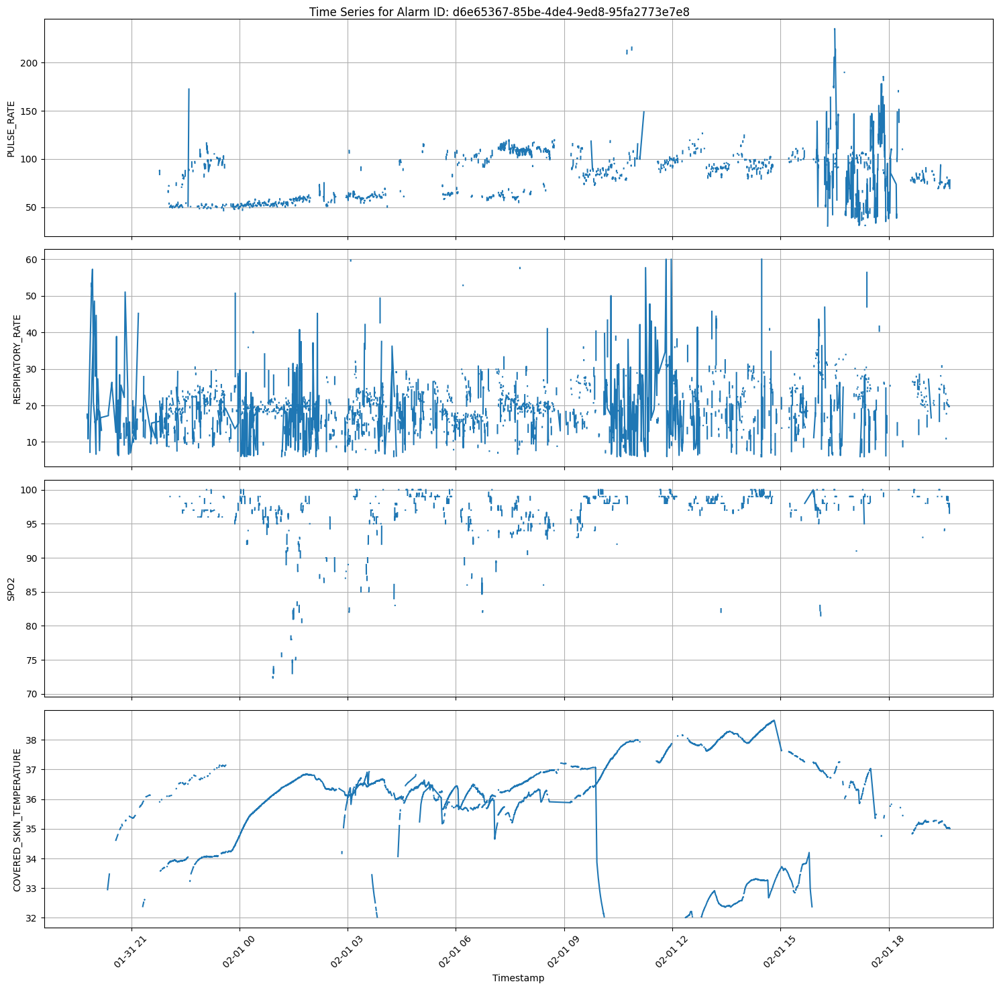

In [ ]:
# prompt: Help me plot the time series for the alamr_id d6e65367-85be-4de4-9ed8-95fa2773e7e8 from the alarm_period_df, create a lot to plot subplots for the four vital signs
import matplotlib.pyplot as plt

# Filter data for the specific alarm_id
alarm_id = 'd6e65367-85be-4de4-9ed8-95fa2773e7e8'
df_alarm = alarm_period_df[alarm_period_df['final_alarm_id'] == alarm_id]

# Create subplots for the four vital signs
fig, axes = plt.subplots(4, 1, figsize=(15, 15), sharex=True)
fig.suptitle(f'Time Series for Alarm ID: {alarm_id}')

vital_signs = ['PULSE_RATE', 'RESPIRATORY_RATE', 'SPO2', 'COVERED_SKIN_TEMPERATURE']
for i, vital in enumerate(vital_signs):
    axes[i].plot(df_alarm['generatedat'], df_alarm[vital])
    axes[i].set_ylabel(vital)
    axes[i].grid(True)

plt.xlabel('Timestamp')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import numpy as np

def get_alarm_period_data_strict_mapping(
    csv_path,
    time_size=20
):
    """
    Reads a merged CSV of vitals + alarms. For each alarm, we only collect
    the 24-hour vital-sign data *corresponding* to that alarm_description.
    E.g. If the alarm description is "Oxygen saturation for SpO2," we keep only
    rows for "SPO2" in [alarm_start, alarm_start + 24h].

    Returns a pivoted DataFrame with columns:
        [patient_id, generatedat, final_alarm_id, <the relevant vital sign> ]
    (Note that rows for a "Temperature" alarm will only have
     COVERED_SKIN_TEMPERATURE populated, etc.)
    """

    # Mapping from alarm_description -> relevant vital sign name
    desc2sign = {
        "Temperature for Covered Skin Temperature": "COVERED_SKIN_TEMPERATURE",
        "Oxygen saturation for SpO2": "SPO2",
        "Respiratory Rate for Respiratory Rate": "RESPIRATORY_RATE",
        "Heart Rate for Pulse Rate": "PULSE_RATE"
    }

    # 1) Read CSV
    df = pd.read_csv(csv_path)

    # 2) Convert relevant columns to datetime
    df['generatedat'] = pd.to_datetime(df['generatedat'], errors='coerce')
    if 'alarm_vital_boundary_start_time' in df.columns:
        df['alarm_vital_boundary_start_time'] = pd.to_datetime(
            df['alarm_vital_boundary_start_time'], errors='coerce'
        )

    # 3) Remove rows without patient_id or numeric data
    df.dropna(subset=['patient_id', 'doublevalue'], inplace=True)

    # 4) We'll filter alarm rows to only those that have alarm_descriptions
    #    in our mapping (desc2sign). Then gather these events.
    alarm_rows = df[~df['alarm_id'].isna()].copy()  # only rows with a real alarm
    # Keep only those alarms that match the four descriptions
    alarm_rows = alarm_rows[alarm_rows['alarm_description'].isin(desc2sign.keys())]

    # Build a dictionary keyed by patient_id => list of (start_time, alarm_id, alarm_desc)
    alarm_events_by_patient = {}
    valid_alarm_events = alarm_rows.dropna(subset=['alarm_vital_boundary_start_time'])
    for pid, sub in valid_alarm_events.groupby('patient_id'):
        records = list(zip(
            sub['alarm_vital_boundary_start_time'],
            sub['alarm_id'],
            sub['alarm_description']
        ))
        # Sort by the start_time
        records.sort(key=lambda x: x[0])
        alarm_events_by_patient[pid] = records

    # 5) Define a function that assigns final_alarm_id if:
    #    - row['name'] == desc2sign[that alarm_desc], and
    #    - row['generatedat'] in [alarm_start, alarm_start + 24h].
    def assign_alarm_id(row):
        pid = row['patient_id']
        gen_time = row['generatedat']
        row_sign = row['name']  # which vital sign is this row?
        if pid not in alarm_events_by_patient:
            return np.nan

        # Check each alarm event for that patient
        for (start_time, aid, desc) in alarm_events_by_patient[pid]:
            # The vital sign we want for this alarm:
            needed_sign = desc2sign[desc]
            # 1) Must match the vital sign
            if row_sign != needed_sign:
                continue
            # 2) Must be within 24 hr of alarm start
            if start_time <= gen_time <= (start_time + pd.Timedelta(hours=24)):
                return aid

        return np.nan

    # 6) Apply the function to each row
    df['final_alarm_id'] = df.apply(assign_alarm_id, axis=1)

    # 7) Keep only rows that actually got an alarm_id
    df = df[~df['final_alarm_id'].isna()].copy()

    # 8) Optionally: Resample (median) in 20-minute bins, if that's what you want
    #    Otherwise, you can skip this and keep the original time stamps.
    df.set_index('generatedat', inplace=True)
    df.sort_index(inplace=True)

    # We group by (patient_id, final_alarm_id, name) then resample => median
    median_values = (
        df
        .groupby(['patient_id', 'final_alarm_id', 'name'])
        .resample(f"{time_size}T")['doublevalue']
        .median()
        .reset_index()
    )

    # 9) Pivot so each row = (patient_id, generatedat, final_alarm_id),
    #    column = name => value = doublevalue
    pivot_df = median_values.pivot_table(
        index=['patient_id','generatedat','final_alarm_id'],
        columns='name',
        values='doublevalue'
    ).reset_index()

    return pivot_df

In [ ]:
alarm_period_df = get_alarm_period_data_strict_mapping(
    csv_path="/content/drive/MyDrive/Uganda/new_data/vital_alarm_sample_ver2.csv",
    # vital_signs=['PULSE_RATE','RESPIRATORY_RATE','SPO2','COVERED_SKIN_TEMPERATURE'],
    time_size=5
)

alarm_period_df.head()

<ipython-input-7-da00454afd73>:29: DtypeWarning: Columns (9,12,13,14,15,16,17,18,19,20,23,24,25,26,27,28,30) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)
<ipython-input-7-da00454afd73>:98: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  .resample(f"{time_size}T")['doublevalue']


name,patient_id,generatedat,final_alarm_id,COVERED_SKIN_TEMPERATURE,PULSE_RATE,RESPIRATORY_RATE,SPO2
0,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:50:00,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,8.565429,NaN
1,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:55:00,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,48.540648,NaN
2,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:00:00,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,18.939493,NaN
3,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:05:00,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,18.248175,NaN
4,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:10:00,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,13.416816,NaN


In [ ]:
alarm_period_df.shape

(2106, 6)

In [ ]:
alarm_period_df.head(50)

name,patient_id,generatedat,final_alarm_id,COVERED_SKIN_TEMPERATURE,PULSE_RATE,RESPIRATORY_RATE,SPO2
0,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:51:25,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,7.183908,NaN
1,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:51:26,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,9.946950,NaN
2,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 19:58:46,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,48.540648,NaN
3,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:00:13,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,27.972757,NaN
4,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:01:42,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,44.642857,NaN
5,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:03:09,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,16.060133,NaN
6,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:03:10,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,16.163793,NaN
7,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:04:38,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,18.939493,NaN
8,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:07:33,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,18.248175,NaN
9,0a6280a6-4eee-4b86-98a5-2e470f989daf,2020-01-31 20:10:29,d6e65367-85be-4de4-9ed8-95fa2773e7e8,NaN,NaN,13.416816,NaN


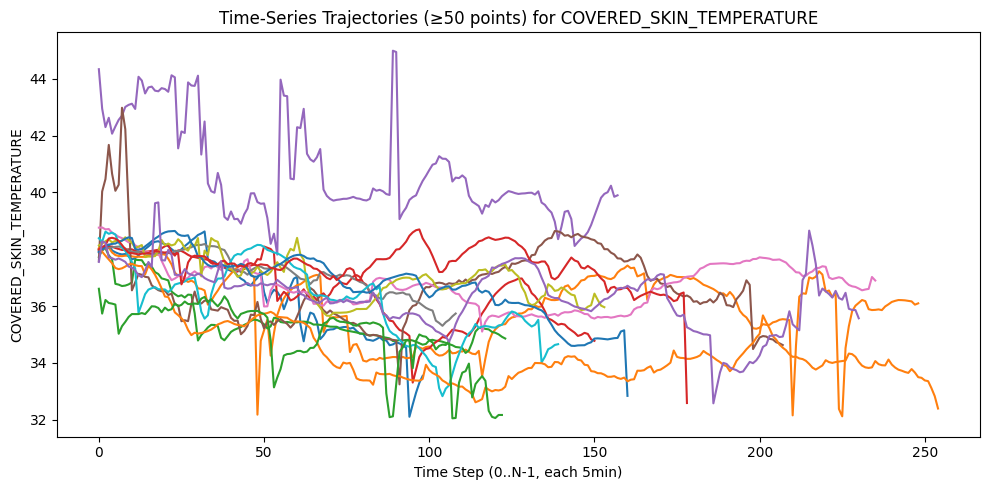

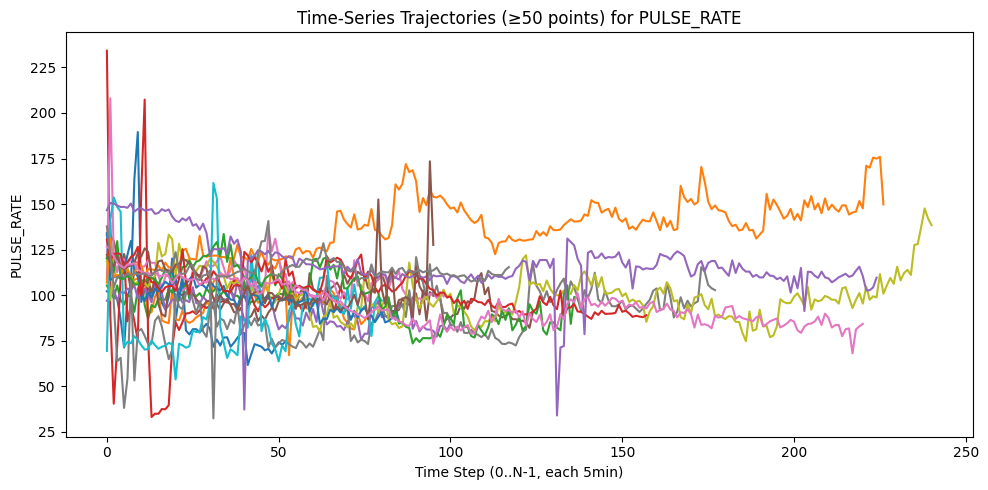

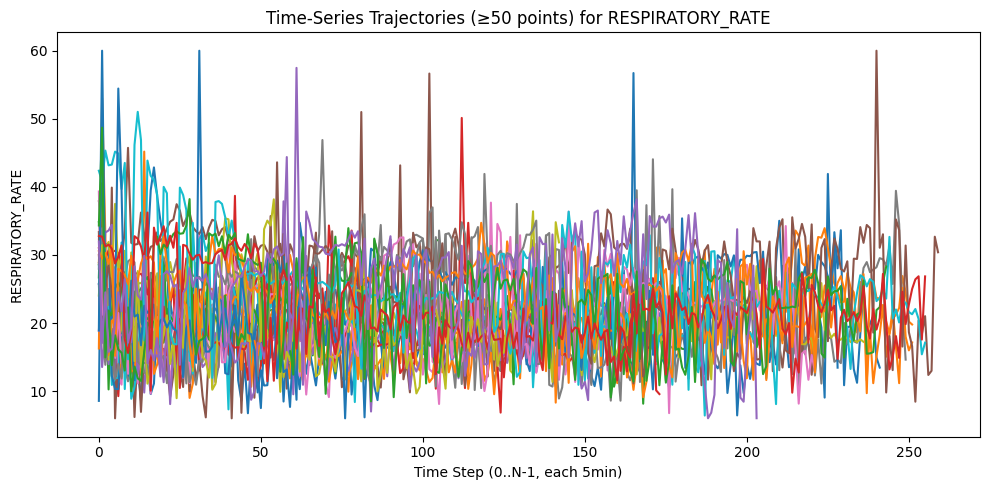

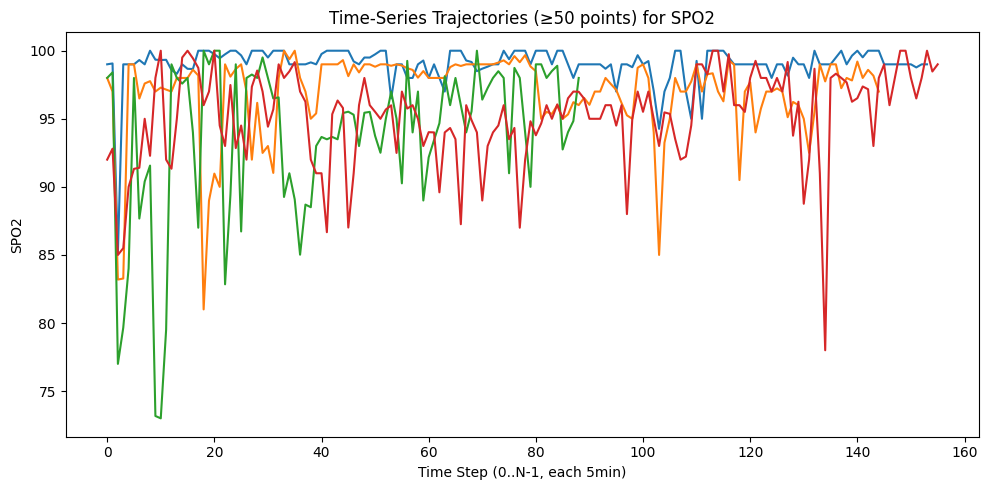

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# --------------------------------------------------------------------------
# Assume you have alarm_period_df with columns something like:
#   [patient_id, generatedat, final_alarm_id,
#    COVERED_SKIN_TEMPERATURE, PULSE_RATE, RESPIRATORY_RATE, SPO2, ...]
#
# And each row is (potentially) 20 minutes apart, though some may be missing.
# We want to require >=30 data points for each vital sign in each group.
# --------------------------------------------------------------------------

vital_signs = ['COVERED_SKIN_TEMPERATURE', 'PULSE_RATE', 'RESPIRATORY_RATE', 'SPO2']
MIN_TIMESTAMPS = 50  # threshold for each vital sign

# 1) Group the data by (patient_id, final_alarm_id)
group_cols = ['patient_id', 'final_alarm_id']
grouped = alarm_period_df.groupby(group_cols)

# 2) For each vital sign, collect time‐series that have >= MIN_TIMESTAMPS
vital_series_dict = {vs: [] for vs in vital_signs}

for (pid, alarm_id), group_df in grouped:
    # We will handle each vital sign separately (rather than filtering the entire group once).
    # Because for PULSE_RATE, e.g., you might have 40 data points, but for SPO2 only 25, etc.
    for vs in vital_signs:
        if vs not in group_df.columns:
            continue

        # Subset to the columns we need; drop rows where this vital is NaN
        subdf_vs = group_df[['generatedat', vs]].dropna(subset=[vs]).copy()
        # Sort by time just in case
        subdf_vs.sort_values(by='generatedat', inplace=True)

        # Check if this subdf has at least MIN_TIMESTAMPS
        if len(subdf_vs) >= MIN_TIMESTAMPS:
            # Store it along with patient_id & alarm_id
            vital_series_dict[vs].append((subdf_vs, pid, alarm_id))

# 3) Plot the selected trajectories for each vital sign
#    X-axis = "time step" from 0..N-1, ignoring actual datetimes.
for vs, series_list in vital_series_dict.items():
    if not series_list:
        print(f"No (patient_id, alarm_id) groups found with >= {MIN_TIMESTAMPS} for {vs}.")
        continue

    plt.figure(figsize=(10, 5))
    for (df_vs, pid, alarm_id) in series_list:
        # "time step" is just the row index 0..N-1 in chronological order
        xvals = range(len(df_vs))
        yvals = df_vs[vs].values

        # For a concise legend, you might abbreviate pid & alarm_id
        lbl = f"{str(pid)[:8]}..|{str(alarm_id)[:8]}.."

        plt.plot(xvals, yvals, label=lbl)

    plt.title(f"Time-Series Trajectories (≥{MIN_TIMESTAMPS} points) for {vs}")
    plt.xlabel("Time Step (0..N-1, each 5min)")
    plt.ylabel(vs)
    # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

<ipython-input-11-e6b79b08aca6>:7: DtypeWarning: Columns (9,12,13,14,15,16,17,18,19,20,23,24,25,26,27,28,30) have mixed types. Specify dtype option on import or set low_memory=False.
  alarm_sample = pd.read_csv('/content/drive/MyDrive/Uganda/new_data/vital_alarm_sample_ver2.csv')


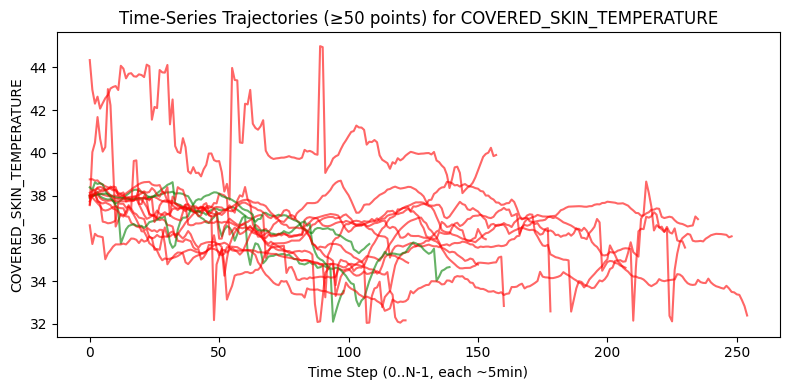

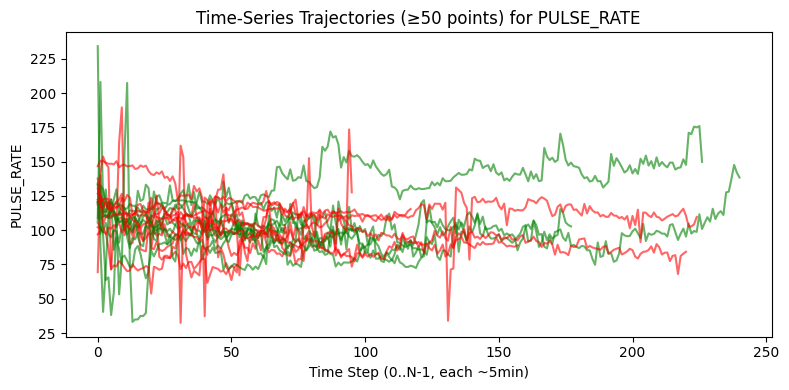

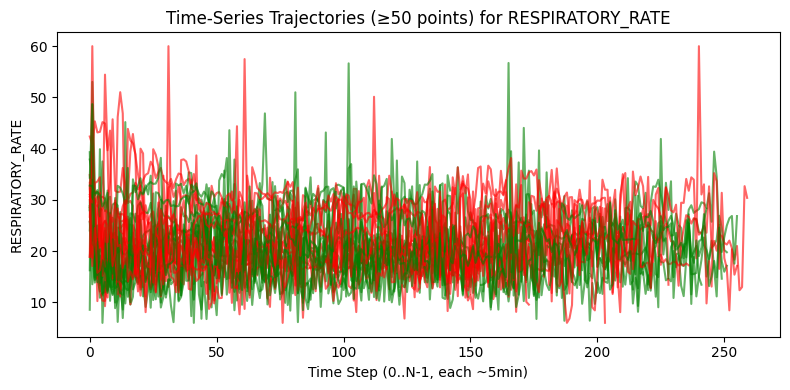

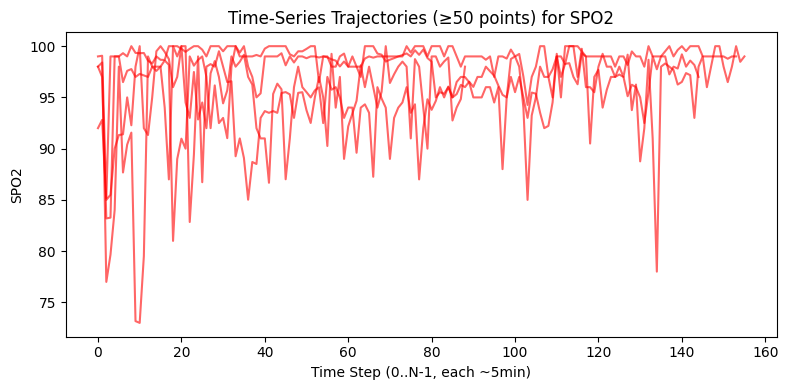

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 0) Suppose you have the alarm data with silence_user_reason
# ------------------------------------------------------------
alarm_sample = pd.read_csv('/content/drive/MyDrive/Uganda/new_data/vital_alarm_sample_ver2.csv')
alarm_sample = alarm_sample[['patient_id','alarm_id','silence_user_reason']].drop_duplicates()

# Build a lookup dict: (patient_id, alarm_id) -> silence_user_reason
# If multiple rows exist for the same (patient_id, alarm_id),
# pick the first or a special logic as needed.
silence_dict = {}
for idx, row in alarm_sample.iterrows():
    pid = row['patient_id']
    aid = row['alarm_id']
    reason = row['silence_user_reason']
    silence_dict[(pid, aid)] = reason

# ------------------------------------------------------------
# 1) We have alarm_period_df from your previous code snippet
#    with columns like [patient_id, generatedat, final_alarm_id,
#    COVERED_SKIN_TEMPERATURE, PULSE_RATE, RESPIRATORY_RATE, SPO2,...]
# ------------------------------------------------------------

vital_signs = ['COVERED_SKIN_TEMPERATURE', 'PULSE_RATE', 'RESPIRATORY_RATE', 'SPO2']
MIN_TIMESTAMPS = 50  # threshold for each vital sign

group_cols = ['patient_id', 'final_alarm_id']
grouped = alarm_period_df.groupby(group_cols)

# 2) For each vital sign, collect time‐series that have >= MIN_TIMESTAMPS
vital_series_dict = {vs: [] for vs in vital_signs}

for (pid, alarm_id), group_df in grouped:
    for vs in vital_signs:
        if vs not in group_df.columns:
            continue

        # Subset to columns we need; drop rows where this vital is NaN
        subdf_vs = group_df[['generatedat', vs]].dropna(subset=[vs]).copy()
        subdf_vs.sort_values(by='generatedat', inplace=True)

        # Keep if at least MIN_TIMESTAMPS
        if len(subdf_vs) >= MIN_TIMESTAMPS:
            vital_series_dict[vs].append((subdf_vs, pid, alarm_id))

# ------------------------------------------------------------
# 3) Color-code each trajectory by silence_user_reason
# ------------------------------------------------------------

# Example color map from user_reason -> a color
# (Expand or adjust as needed.)
color_map = {
    'ASSIGNMENT_ENDED': 'red',
    'RISK_ENDED': 'green',
    'NO_RISK': 'green',
    # or any categories you expect in silence_user_reason
}
default_color = 'gray'  # fallback color if not found in color_map

for vs, series_list in vital_series_dict.items():
    if not series_list:
        print(f"No (patient_id, alarm_id) groups found with >= {MIN_TIMESTAMPS} for {vs}.")
        continue

    plt.figure(figsize=(8, 4))
    for (df_vs, pid, alarm_id) in series_list:
        xvals = range(len(df_vs))
        yvals = df_vs[vs].values

        # Lookup the reason from your dictionary:
        reason = silence_dict.get((pid, alarm_id), None)
        if reason in color_map:
            color = color_map[reason]
        else:
            color = default_color

        # Create a label that includes or abbreviates the reason
        lbl = f"{pid[:8]}|{alarm_id[:8]}|{reason}"

        plt.plot(xvals, yvals, label=lbl, color=color, alpha=0.6)

    plt.title(f"Time-Series Trajectories (≥{MIN_TIMESTAMPS} points) for {vs}")
    plt.xlabel("Time Step (0..N-1, each ~5min)")
    plt.ylabel(vs)

    # If the legend is too large, you might remove it or show just the color mapping
    # plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.tight_layout()
    plt.show()

Vital sign: COVERED_SKIN_TEMPERATURE
   Silhouette Score = 0.400 (higher is better, max=1)
   Davies-Bouldin   = 0.879 (lower is better)
   Cluster counts => cluster0: 4, cluster1: 11


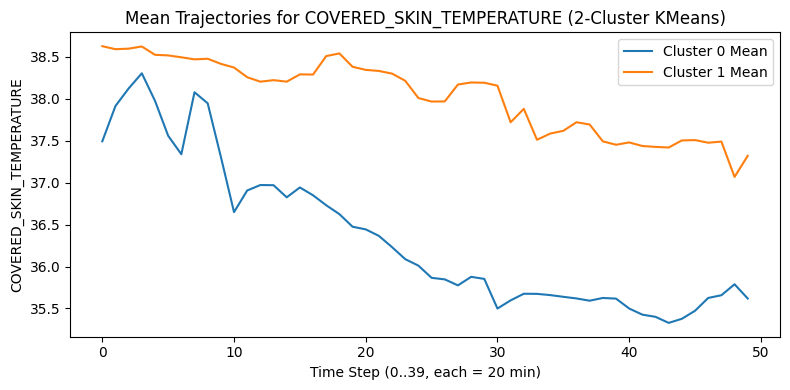

Vital sign: PULSE_RATE
   Silhouette Score = 0.266 (higher is better, max=1)
   Davies-Bouldin   = 1.168 (lower is better)
   Cluster counts => cluster0: 9, cluster1: 9


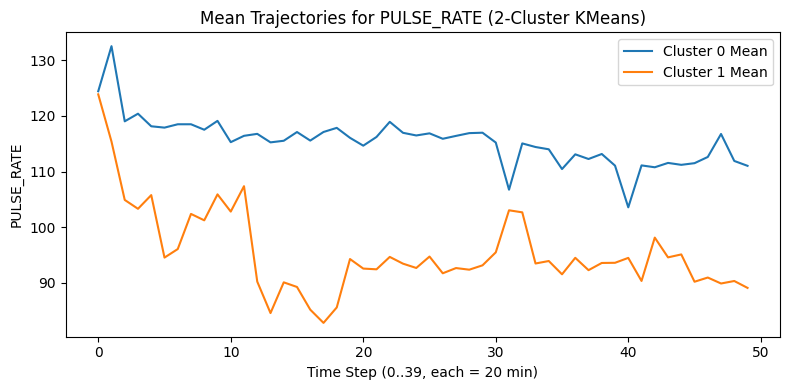

Vital sign: RESPIRATORY_RATE
   Silhouette Score = 0.269 (higher is better, max=1)
   Davies-Bouldin   = 1.391 (lower is better)
   Cluster counts => cluster0: 18, cluster1: 7


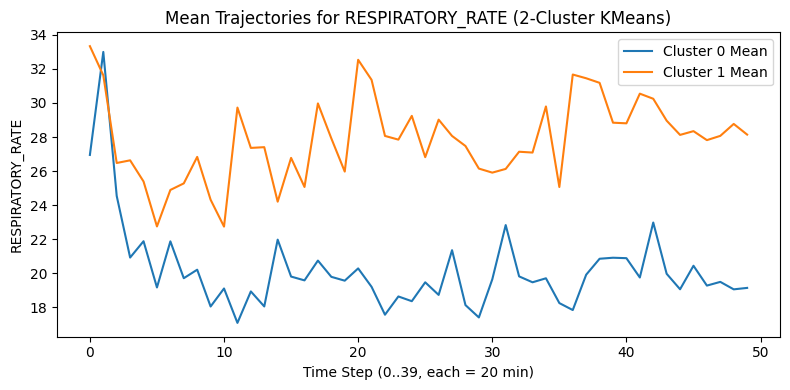

Vital sign: SPO2
   Silhouette Score = 0.153 (higher is better, max=1)
   Davies-Bouldin   = 1.048 (lower is better)
   Cluster counts => cluster0: 2, cluster1: 2


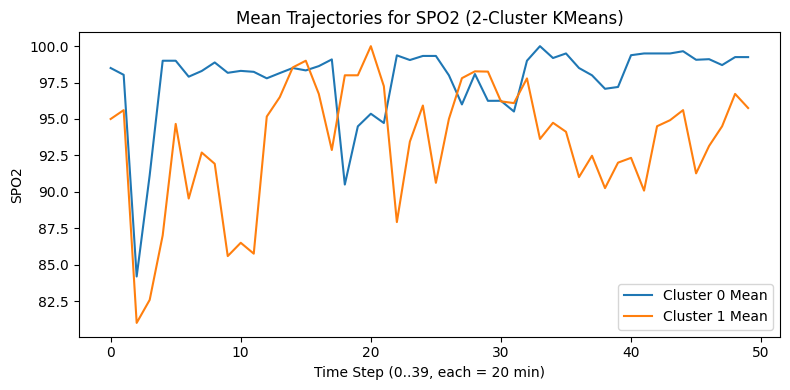

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score

# We'll assume you already have:
#   vital_series_dict[vital_sign] = [
#       (subdf_vs, patient_id, alarm_id),
#       ...
#   ]
# where each subdf_vs has >= MIN_TIMESTAMPS rows, sorted by time,
# and the vital_sign is in subdf_vs[vital_sign].

MIN_TIMESTAMPS = 50  # from your code

for vs, series_list in vital_series_dict.items():
    if not series_list:
        print(f"No (patient_id, alarm_id) groups found with >= {MIN_TIMESTAMPS} for {vs}.")
        continue

    # 1) Build feature matrix X where each row is a flattened time-series of length 40
    X = []
    metadata = []  # store (patient_id, alarm_id) for reference

    for (df_vs, pid, alarm_id) in series_list:
        # Extract the first MIN_TIMESTAMPS points
        yvals = df_vs[vs].values
        yvals_40 = yvals[:MIN_TIMESTAMPS]  # if subdf has > 40 rows, we truncate
        # (If you want exactly 40, this is fine. If subdf has exactly 40, that is also fine.)

        X.append(yvals_40)
        metadata.append((pid, alarm_id))

    # Convert to numpy array
    X = np.array(X)  # shape => (#time_series, 40)

    # 2) Optional: scale
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # 3) Cluster with KMeans (2 clusters)
    kmeans = KMeans(n_clusters=2, random_state=42, n_init="auto")
    labels = kmeans.fit_predict(X_scaled)

    # 4) Evaluate the clustering if we have at least 2 points
    #    (If there's only 1 or 0 time-series, we can't compute silhouette or DBI.)
    if len(X_scaled) > 1:
        sil = silhouette_score(X_scaled, labels)
        dbi = davies_bouldin_score(X_scaled, labels)
        print(f"Vital sign: {vs}")
        print(f"   Silhouette Score = {sil:.3f} (higher is better, max=1)")
        print(f"   Davies-Bouldin   = {dbi:.3f} (lower is better)")
    else:
        print(f"Not enough time-series to cluster for {vs}")

    # 5) Examine cluster sizes
    c0 = np.sum(labels == 0)
    c1 = np.sum(labels == 1)
    print(f"   Cluster counts => cluster0: {c0}, cluster1: {c1}")

    # 6) (Optional) Visualize the cluster centers or sample curves
    #    For example, let's plot the mean time-series of each cluster:
    cluster0_mean = X[labels == 0].mean(axis=0)  # average over all rows in cluster 0
    cluster1_mean = X[labels == 1].mean(axis=0)  # average over all rows in cluster 1

    plt.figure(figsize=(8, 4))
    plt.plot(range(MIN_TIMESTAMPS), cluster0_mean, label="Cluster 0 Mean")
    plt.plot(range(MIN_TIMESTAMPS), cluster1_mean, label="Cluster 1 Mean")
    plt.title(f"Mean Trajectories for {vs} (2-Cluster KMeans)")
    plt.xlabel("Time Step (0..39, each = 20 min)")
    plt.ylabel(vs)
    plt.legend()
    plt.tight_layout()
    plt.show()